#  Data reprocessing


In [1]:
import stlearn as st
from pathlib import Path
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import cm as cm 
import numpy as  np
import matplotlib as mpl
import pandas as pd
#mpl.rcParams["font.sans-serif"] = ["SimHei"]
#mpl.rcParams["axes.unicode_minus"] = False
st.settings.set_figure_params(dpi=120)
# Reading data
data = st.Read10X(path="/Users/lexiiiii/onedrive/Work/phD/phd_project/SiT/rawdata/before/Result_X101SC21081081-Z01-J001/1.Count/P1_before/filtered_feature_bc_matrix")





/Users/lexiiiii/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [2]:
data


AnnData object with n_obs × n_vars = 492 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

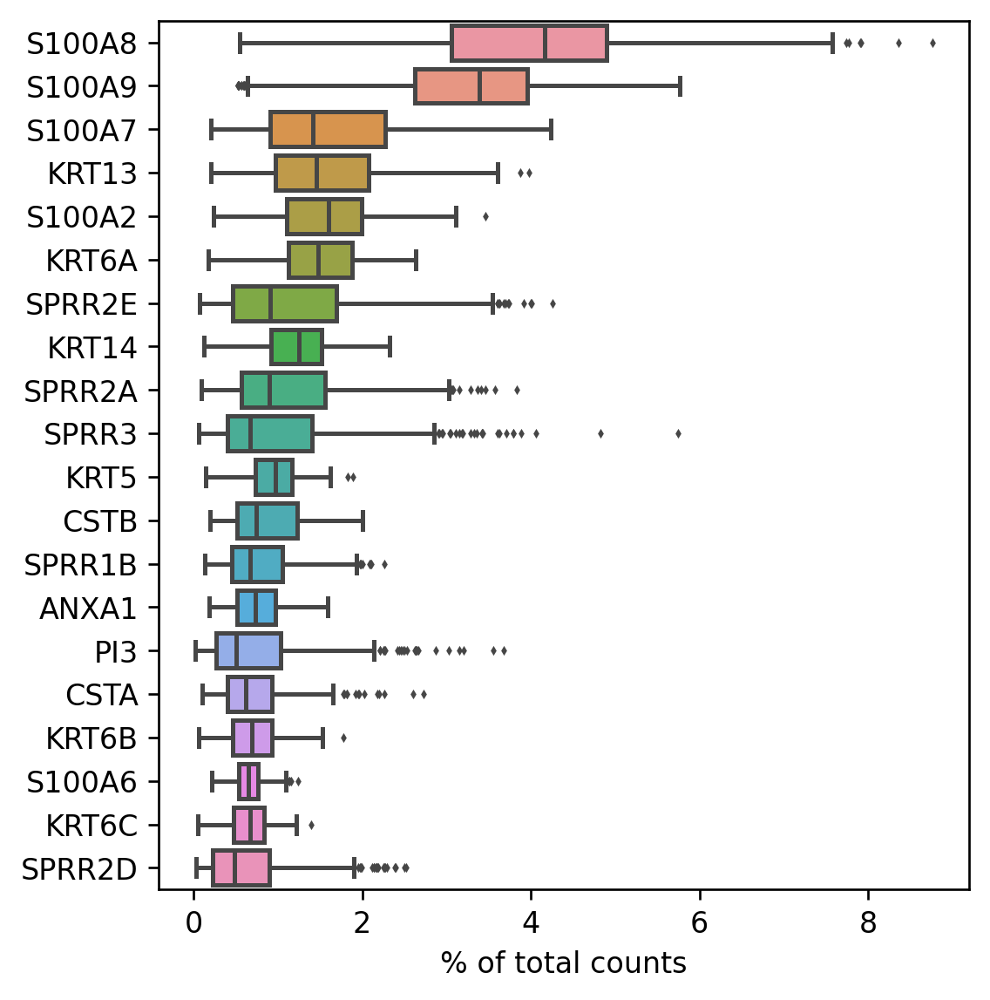

In [3]:

sc.pl.highest_expr_genes(data, n_top=20,save=".pdf")


# QC, normalization

In [2]:
# Save raw_count
data.layers["raw_count"] = data.X
# Preprocessing
st.pp.filter_genes(data,min_cells=3)

st.pp.normalize_total(data)
st.pp.log1p(data)

data.layers["normal_count"] = data.X
# Keep raw data
data.raw = data
#data
st.pp.scale(data)
# 再存一份scale的数据
data.layers["scale_count"] = data.X

# 也存了三分数据：
#print(data.layers['raw_count'])
#print(data.layers["normal_count"])
#print(data.layers['scale_count'])


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


## PCA UMAP

In [3]:
st.em.run_pca(data,n_comps=50,random_state=0)
st.pp.neighbors(data,n_neighbors=25,use_rep='X_pca',random_state=0)
sc.tl.umap(data)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


# Add cell annotation (or umap cluster)

In [4]:
cluster_info = pd.read_csv("/Users/lexiiiii/onedrive/Work/phD/phd_project/SiT/results/before/P1_before.seurat.cluster.csv")
cluster_info

,Barcode,Cluster
0,AAACTGCTGGCTCCAA-1,0
1,AAAGGGATGTAGCAAG-1,3
2,AAAGTGTGATTTATCT-1,0
3,AAATACCTATAAGCAT-1,0
4,AAATAGGGTGCTATTG-1,0
...,...,...
487,TTGTAAGGCCAGTTGG-1,4
488,TTGTCGTTCAGTTACC-1,2
489,TTGTGGCCCTGACAGT-1,3
490,TTGTTCAGTGTGCTAC-1,3


## Check if there is missing cell

In [7]:
list( set(data.obs.index) - set(cluster_info["Barcode"]) )

[]

## check index of missing cell

In [16]:
test = data.obs
test["cell"] = test.index
test.reset_index(inplace = True)
test
list( set(test["cell"]) - set(cluster_info["Barcode"]) )

['ATAGACGAAGAGAAAG-1', 'TACCGGTCGTTTCCAT-1', 'GGCGGAGTAATATTAG-1']

In [18]:
uniq_index =pd.Index(test["cell"])
uniq_index.get_loc("ATAGACGAAGAGAAAG-1")


245

In [19]:
uniq_index.get_loc("TACCGGTCGTTTCCAT-1")


943

In [20]:
uniq_index.get_loc("GGCGGAGTAATATTAG-1")

787

## Set cluster 

In [5]:
data.obs["seurat"] = pd.Categorical(cluster_info["Cluster"].astype(str))
data.obs['seurat']

AAACTGCTGGCTCCAA-1    0
AAAGGGATGTAGCAAG-1    3
AAAGTGTGATTTATCT-1    0
AAATACCTATAAGCAT-1    0
AAATAGGGTGCTATTG-1    0
                     ..
TTGTAAGGCCAGTTGG-1    4
TTGTCGTTCAGTTACC-1    2
TTGTGGCCCTGACAGT-1    3
TTGTTCAGTGTGCTAC-1    3
TTGTTGTGTGTCAAGA-1    4
Name: seurat, Length: 492, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [6]:
labels = data.obs['seurat'].value_counts().index
colors_ =  ["#0073c299","#EFC00099","#86868699","#CD534C99",
            "#7AA5DC99","#003C6799","#8F770099","#3B3B3B99"]
students = data.obs['seurat'].value_counts()


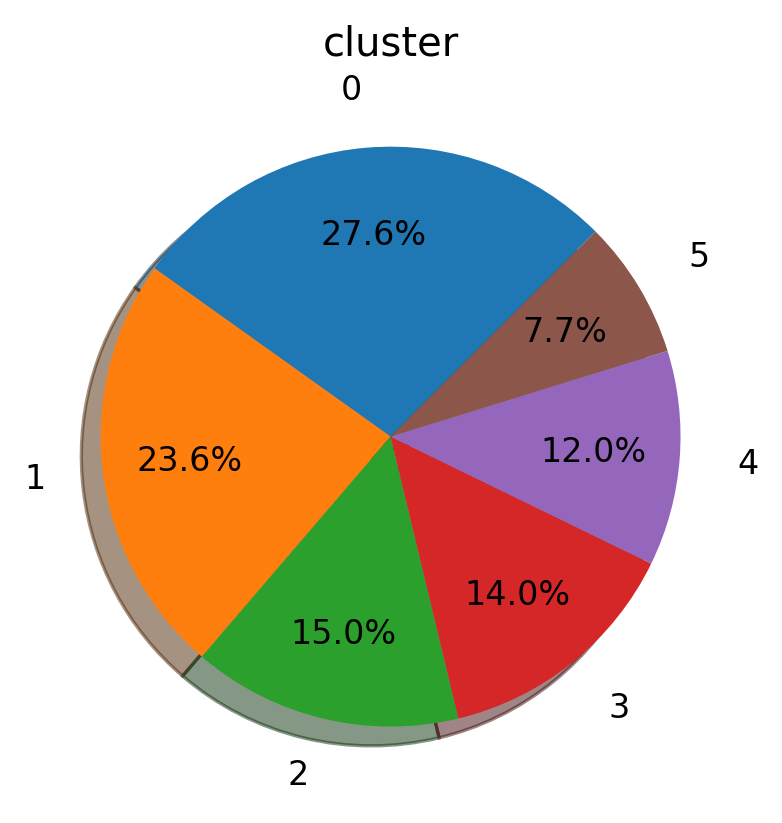

In [12]:


plt.pie(students,
        labels= labels,
        startangle=45,
        autopct="%3.1f%%",
        shadow= True,
        pctdistance= 0.7,
        labeldistance= 1.2 )
plt.title("cluster")
fig=plt.gcf()
fig.savefig('before/cluster_piechart.pdf')
plt.show()


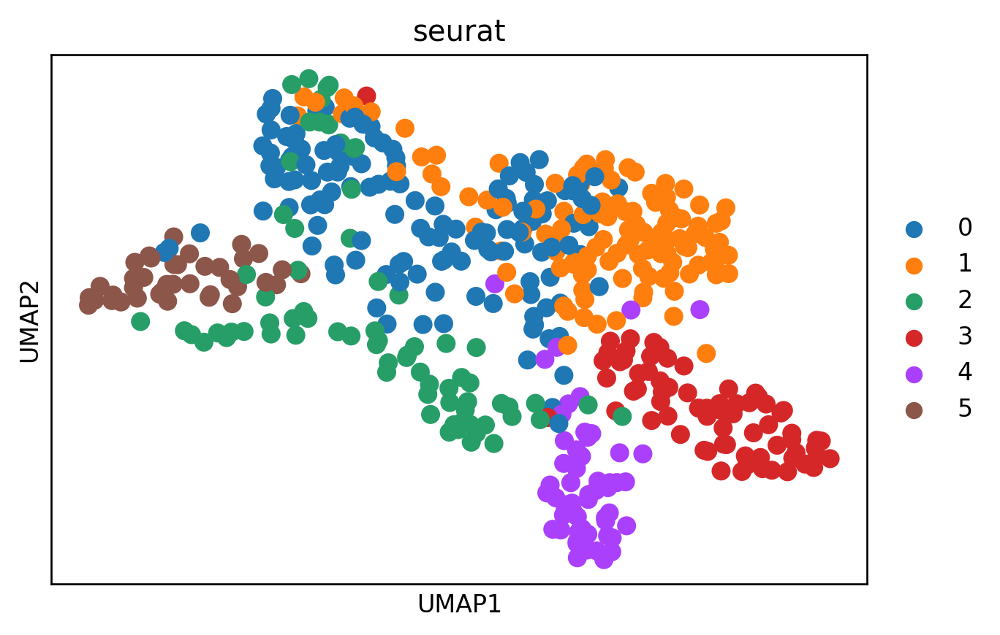

In [13]:
sc.pl.umap(data, color='seurat', palette=sc.pl.palettes.default_20,save=".pdf")


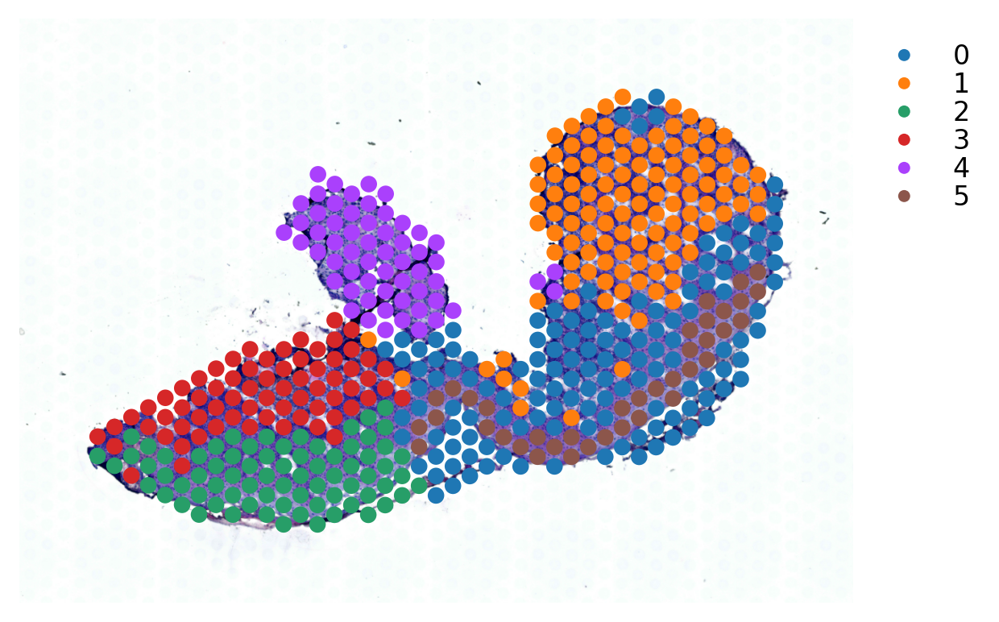

In [14]:
st.pl.cluster_plot(data,use_label="seurat",size =38)
fig=plt.gcf()
fig.savefig('before/cluster_stlearn.pdf')


## add SPOTlight info

In [7]:
st.add.add_deconvolution(data,annotation_path="before/before_deconvolution_result.csv",copy = True)


## Check if there is missing cell

In [17]:
data.obs.index = deco_info.columns[2:]

NameError: name 'deco_info' is not defined

In [88]:
deco_info = pd.read_csv("before/before_deconvolution_result.csv")
deco_info.columns[2:]

Index(['GGCGGAGTAATATTAG-1', 'AAACAAGTATCTCCCA-1', 'ATAGACGAAGAGAAAG-1',
       'AAACAAGTATCTCCCA-1.1', 'AAACCCGAACGAAATC-1', 'AAACCGTTCGTCCAGG-1',
       'AAACGAGACGGTTGAT-1', 'AAACTGCTGGCTCCAA-1', 'AAAGGCTCTCGCGCCG-1',
       'AAAGGGATGTAGCAAG-1',
       ...
       'TTGGTCACACTCGTAA-1', 'TTGTAAGGACCTAAGT-1', 'TTGTAAGGCCAGTTGG-1',
       'TTGTAATCCGTACTCG-1', 'TTGTGAACCTAATCCG-1', 'TTGTGCAGCCACGTCA-1',
       'TTGTGTATGCCACCAA-1', 'TTGTGTTTCCCGAAAG-1', 'TTGTTCAGTGTGCTAC-1',
       'TTGTTGTGTGTCAAGA-1'],
      dtype='object', length=1247)

In [ ]:
deco_info = pd.read_csv("before/before_deconvolution_result.csv")
deco_info.columns[2:]

In [82]:
list( set(data.obs.index) - set(deco_info.columns[2:]) )

['TACCGGTCGTTTCCAT-1',
 'GGCGGAGTAATATTAG-1',
 'AAACAAGTATCTCCCA-1',
 'ATAGACGAAGAGAAAG-1']

In [90]:
label = data.obsm["deconvolution"].T
label

,AAACAAGTATCTCCCA-1,AAACCCGAACGAAATC-1,AAACCGTTCGTCCAGG-1,AAACGAGACGGTTGAT-1,AAACTGCTGGCTCCAA-1,AAAGGCTCTCGCGCCG-1,AAAGGGATGTAGCAAG-1,AAAGTGTGATTTATCT-1,AAAGTTGACTCCCGTA-1,AAATACCTATAAGCAT-1,...,TTGGTCACACTCGTAA-1,TTGTAAGGACCTAAGT-1,TTGTAAGGCCAGTTGG-1,TTGTAATCCGTACTCG-1,TTGTGAACCTAATCCG-1,TTGTGCAGCCACGTCA-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1
Bcell,0.125,0.000000,0.094558,0.200886,0.131885,0.059262,0.023205,0.021148,0.034500,0.133392,...,0.032798,0.102261,0.203450,0.066826,0.000000,0.030726,0.078199,0.062782,0.043343,0.075560
Endothelial,0.125,0.030023,0.122638,0.091029,0.107657,0.151992,0.083834,0.062437,0.018825,0.123900,...,0.161341,0.063118,0.088055,0.088833,0.053425,0.061287,0.085493,0.075499,0.051421,0.057017
Epithelia,0.125,0.632325,0.142488,0.168224,0.216147,0.075674,0.528767,0.484611,0.509510,0.161339,...,0.085590,0.281196,0.057671,0.179971,0.594484,0.309614,0.199211,0.261977,0.412022,0.386608
Fibroblast,0.125,0.017778,0.163489,0.102114,0.114959,0.285883,0.022716,0.059392,0.024528,0.110299,...,0.175944,0.110841,0.148736,0.173037,0.015292,0.068873,0.165329,0.117558,0.080768,0.082063
FRC,0.125,0.156285,0.147007,0.124849,0.094001,0.094625,0.159633,0.243205,0.256666,0.129534,...,0.123501,0.158679,0.061086,0.159548,0.199027,0.213044,0.195011,0.148954,0.214261,0.155356
Myeloid,0.125,0.085420,0.065357,0.084296,0.066151,0.129511,0.071783,0.102197,0.084246,0.055687,...,0.089549,0.057034,0.161138,0.086231,0.060207,0.108033,0.070819,0.055928,0.051631,0.145280
Pericytes,0.125,0.035388,0.177401,0.064150,0.146022,0.134415,0.051252,0.000000,0.000000,0.198018,...,0.243950,0.132515,0.015923,0.147043,0.054594,0.089673,0.129508,0.188444,0.063291,0.028873
Tcell,0.125,0.042781,0.087062,0.164452,0.123177,0.068638,0.058810,0.027010,0.071725,0.087831,...,0.087327,0.094354,0.263942,0.098512,0.022971,0.118751,0.076430,0.088858,0.083262,0.069243


/Users/lexiiiii/opt/anaconda3/lib/python3.9/site-packages/stlearn/plotting/deconvolution_plot.py:113: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  _ = ax.pie(


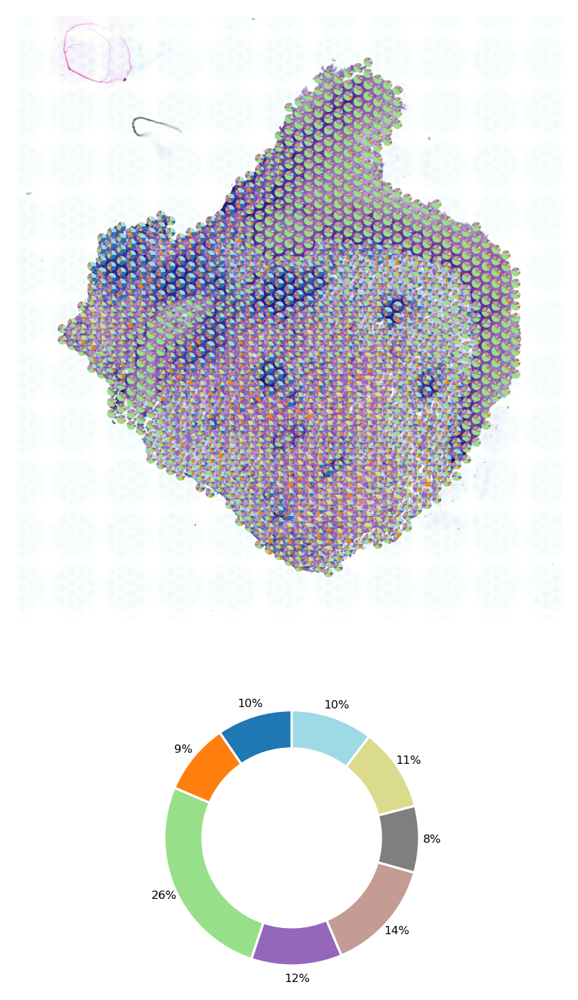

In [91]:
st.pl.deconvolution_plot(data,show_legend = False,output = "figures")


# 空间轨迹推断
## choose the root by our own


In [8]:
### 根据反卷积结果 assign cell type
st.add.annotation(data,label_list=['FRC and Epithelial KRT178- ','FRC,Fibroblast and Epithelial CXCL14+',
                                  'FRC and Epithelial KRT4+','Bcell,FRC and Epithelial IFITM3+',
                                  'FRC and Epithelial IGFBP5+', 'Epithelial MUC4+'],
                 use_label="seurat")


The annotation is added to adata.obs['seurat_anno']


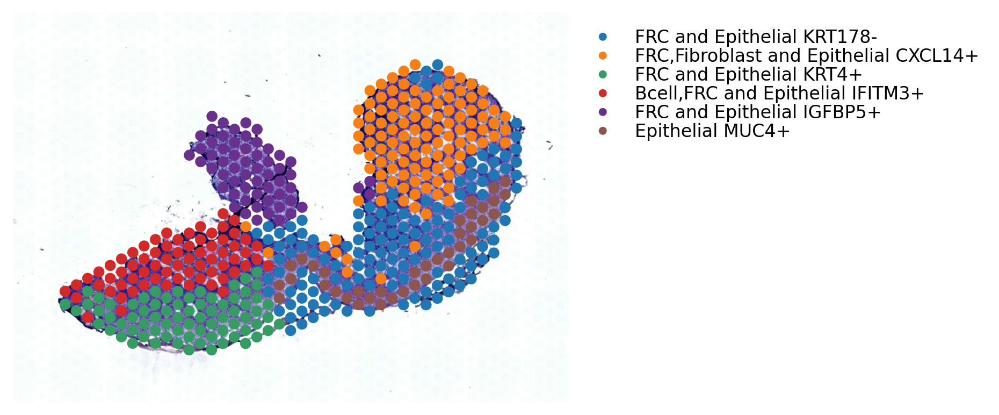

In [22]:
st.pl.cluster_plot(data,use_label="seurat_anno",image_alpha=1,size=38)
fig=plt.gcf()
fig.savefig('before/annot_cluster_stlearn.pdf')

## Set cluster5 as root

In [9]:
import numpy as np
data.uns["iroot"] = st.spatial.trajectory.set_root(data,use_label="seurat",cluster=5,use_raw=True)
st.spatial.trajectory.pseudotime(data,eps=50,use_rep="X_pca",use_label = "seurat_anno" )
data



Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


AnnData object with n_obs × n_vars = 492 × 16328
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'seurat', 'seurat_anno', 'sub_cluster_labels', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'iroot', 'seurat_anno_index_dict', 'paga', 'seurat_anno_sizes', 'diffmap_evals', 'threshold_spots', 'split_node', 'global_graph', 'centroid_dict', 'available_paths'
    obsm: 'spatial', 'X_pca', 'X_umap', 'deconvolution', 'X_diffmap'
    varm: 'PCs'
    layers: 'raw_count', 'normal_count', 'scale_count'
    obsp: 'distances', 'connectivities'

PAGA plot:


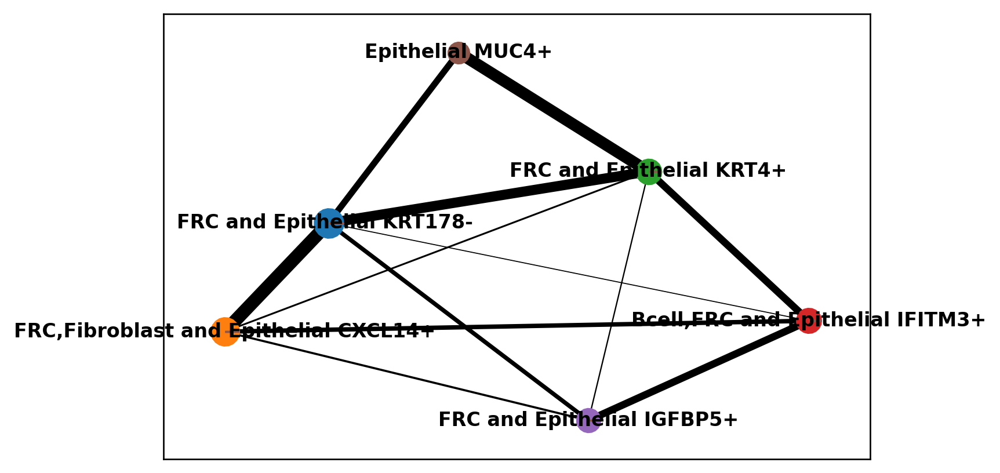

Gene expression (reduced dimension) plot:


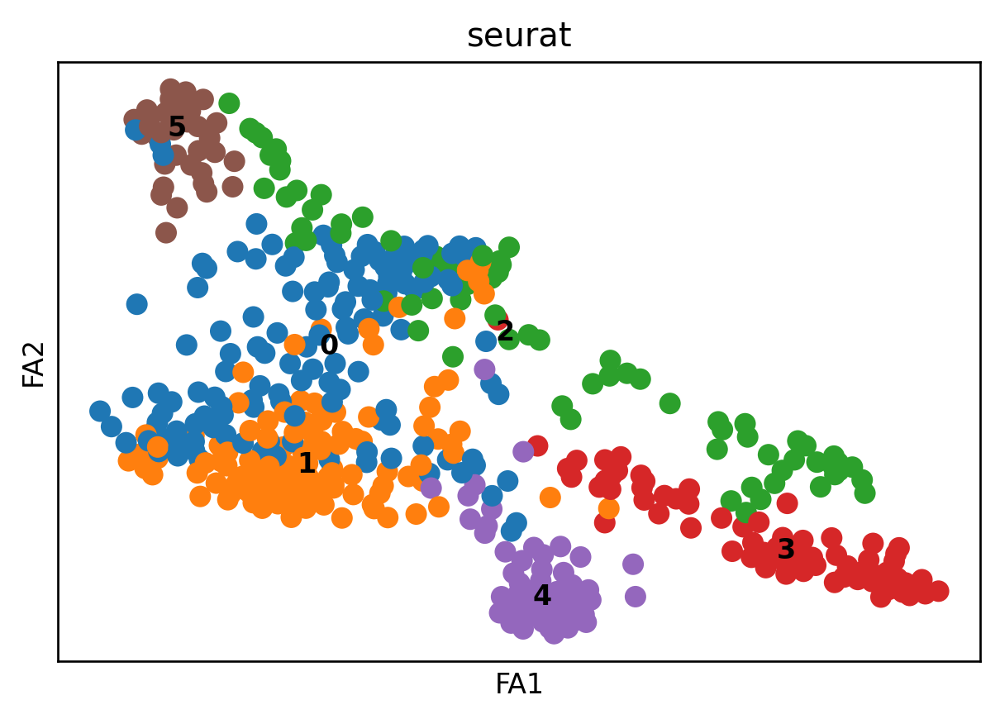

Diffusion pseudotime plot:


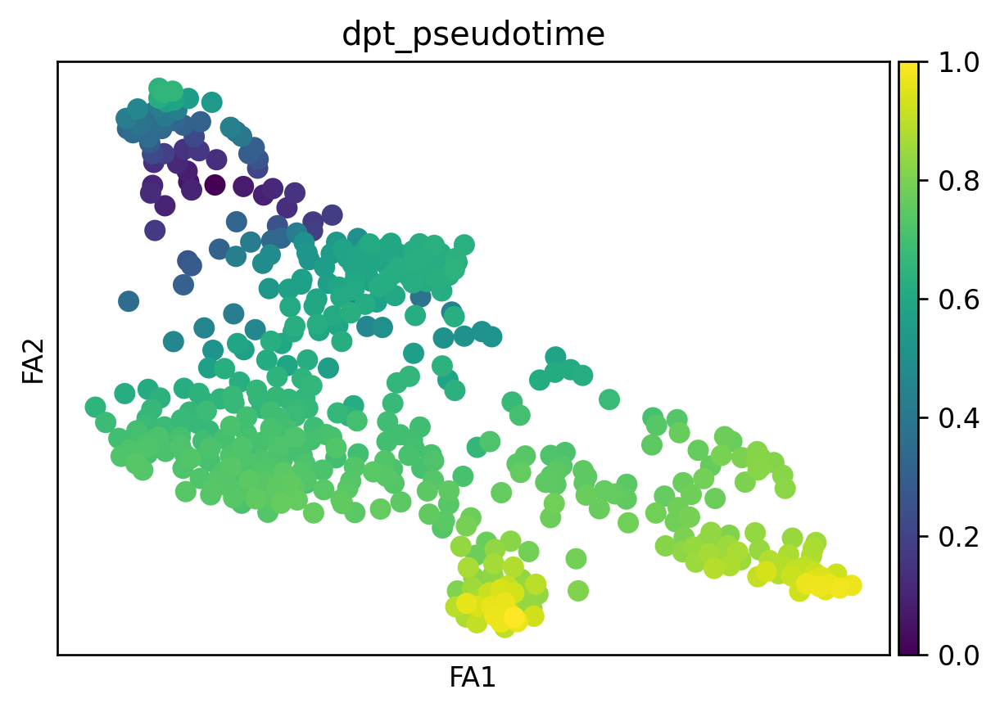

In [12]:
import dataframe_image as dfi
non_spatial_plot(data,use_label="seurat")
#non_spatial_plot(data,use_label="seurat_anno")

## Get spatial trajectory plot for cluster 1 cluster4 and cluster3

/Users/lexiiiii/opt/anaconda3/lib/python3.9/site-packages/stlearn/plotting/trajectory/pseudotime_plot.py:265: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cmap="viridis")


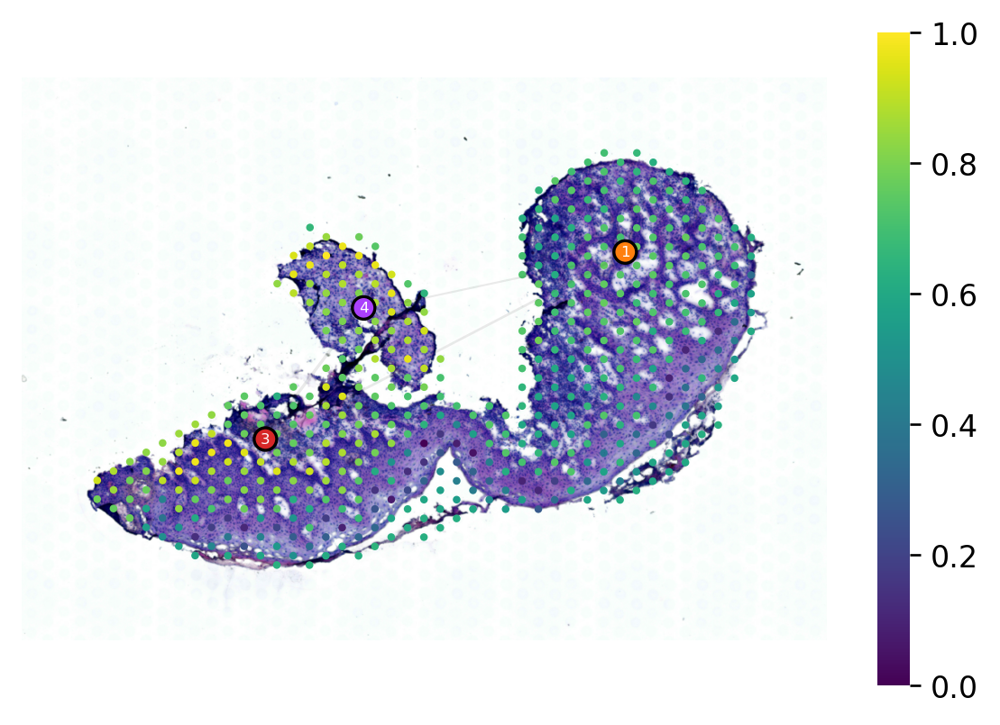

In [53]:
# spatial trajectory plot of cluster 3 4
st.pl.trajectory.pseudotime_plot(data,use_label = "seurat",show_graph=True,node_alpha=1,list_clusters=['1','4','3'],
edge_alpha=0.1,node_size=5,pseudotime_key = "dpt_pseudotime",output = "before",name = "134trajectory.pseudotime_plot.pdf")


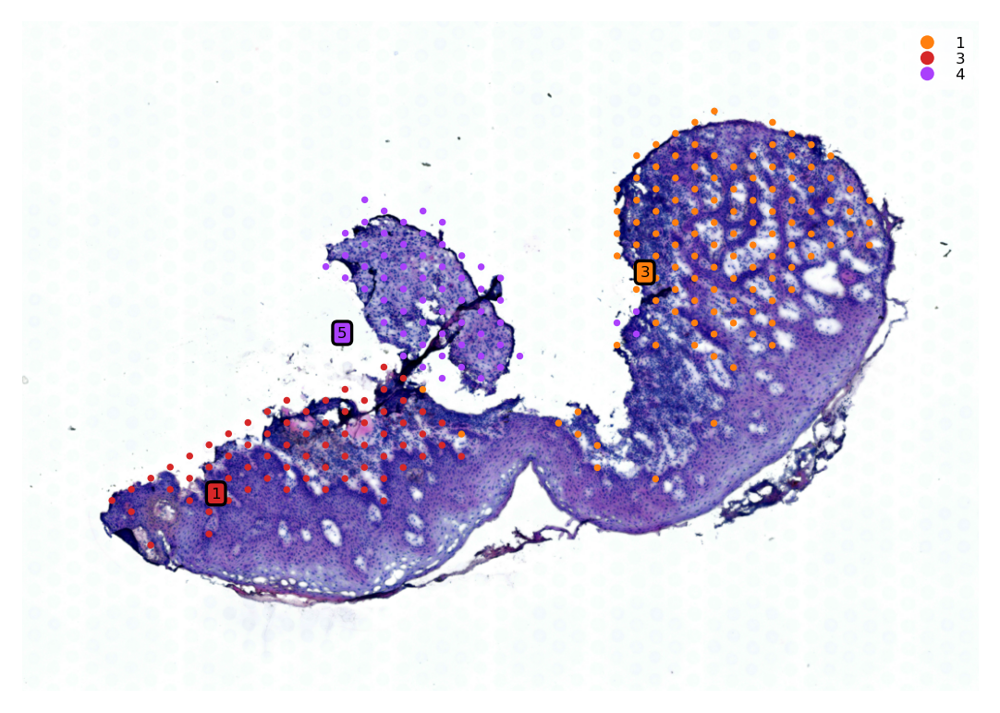

In [54]:
st.pl.cluster_plot(data,use_label="seurat",show_subcluster=True,show_color_bar=True, 
                   list_clusters=['1','3','4'],color_bar_size = 5,
                   )
fig=plt.gcf()
fig.savefig("before/134_cluster_plot.pdf")

In [55]:
st.spatial.trajectory.pseudotimespace_global(data,use_label="seurat_anno",list_clusters=['FRC,Fibroblast and Epithelial CXCL14+',
                                                                                         'Bcell,FRC and Epithelial IFITM3+', 'FRC and Epithelial IGFBP5+'])




Screening PTS global graph...


Screening: 100%|███████████████████████████████████████████ [ time left: 00:00 ]


Calculate the graph dissimilarity using Laplacian matrix...


Calculating: 100%|█████████████████████████████████████████ [ time left: 00:00 ]

The optimized weighting is: 0.5
Start to construct the trajectory: 1 -> 3 -> 4


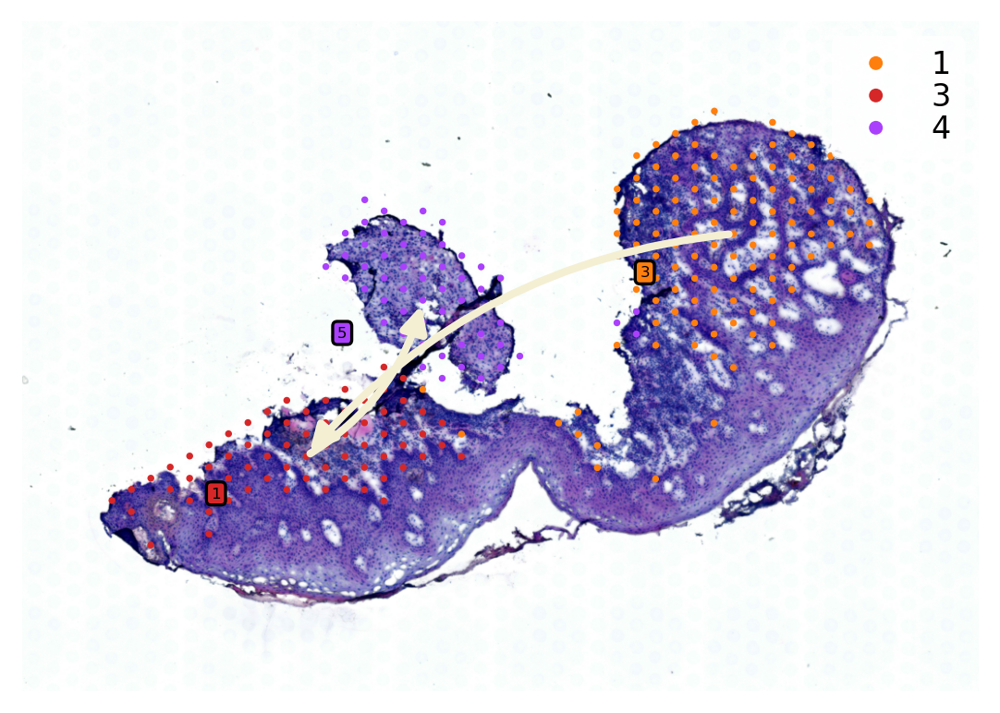

In [56]:
st.pl.cluster_plot(data,use_label="seurat",show_subcluster=True,list_clusters=['1','3','4'],show_trajectories = True)
plt.savefig("before/134_cluster.trajectory.pseudotimespace_global.pdf")

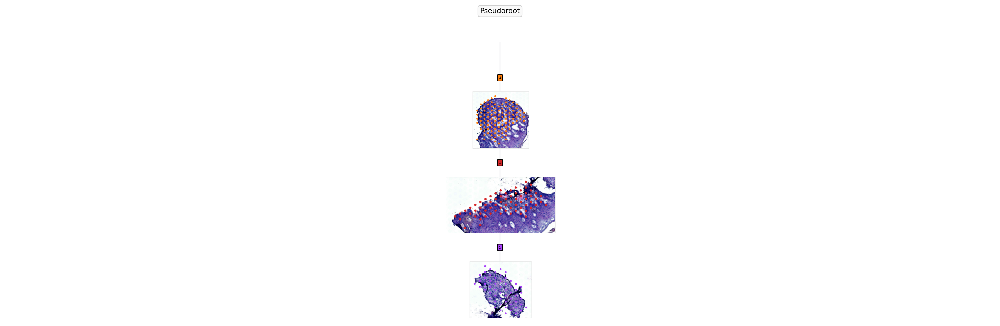

In [57]:
st.pl.trajectory.tree_plot(data,use_label = "seurat",figsize = [25,8],output = "before",name = "134_cluster_trajectory.tree_plot.pdf")


## Detect markers for all clades

In [58]:
st.spatial.trajectory.detect_transition_markers_clades(data,clade=3,use_raw_count=True)



Detecting the transition markers of clade_3...
Transition markers result is stored in adata.uns['clade_3']


In [59]:
st.spatial.trajectory.detect_transition_markers_clades(data,clade=1,use_raw_count=True)


Detecting the transition markers of clade_1...
Transition markers result is stored in adata.uns['clade_1']


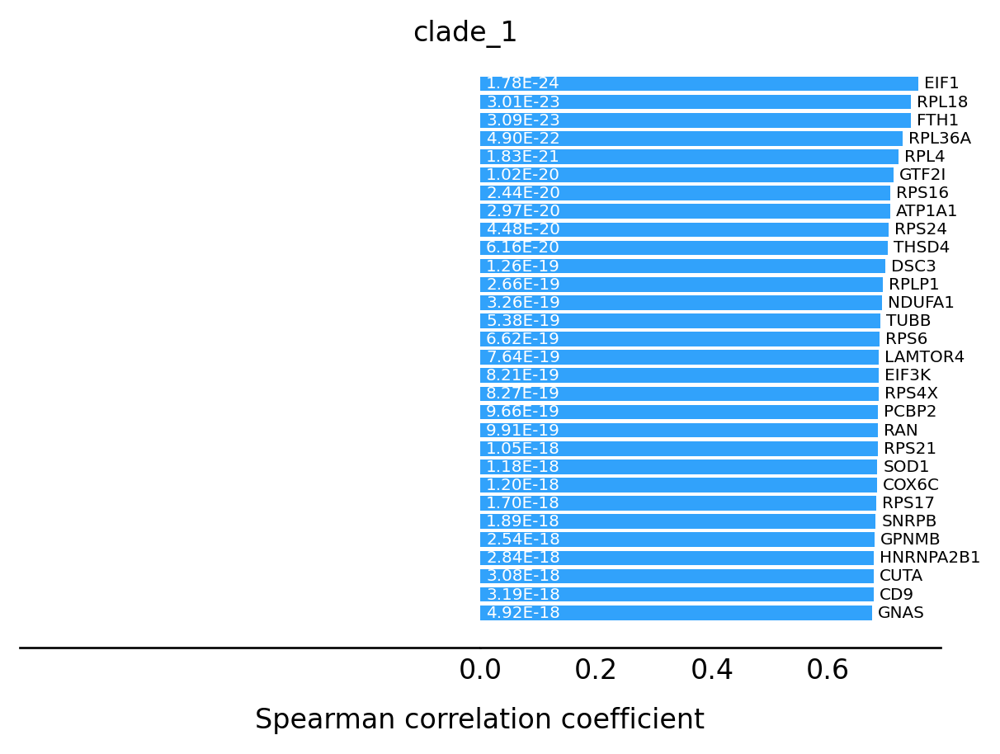

In [61]:
st.pl.trajectory.transition_markers_plot(data,top_genes=30,trajectory="clade_1",output = "before",name = "clade1_cluster2__trajectory.transition_markers_plot.pdf")


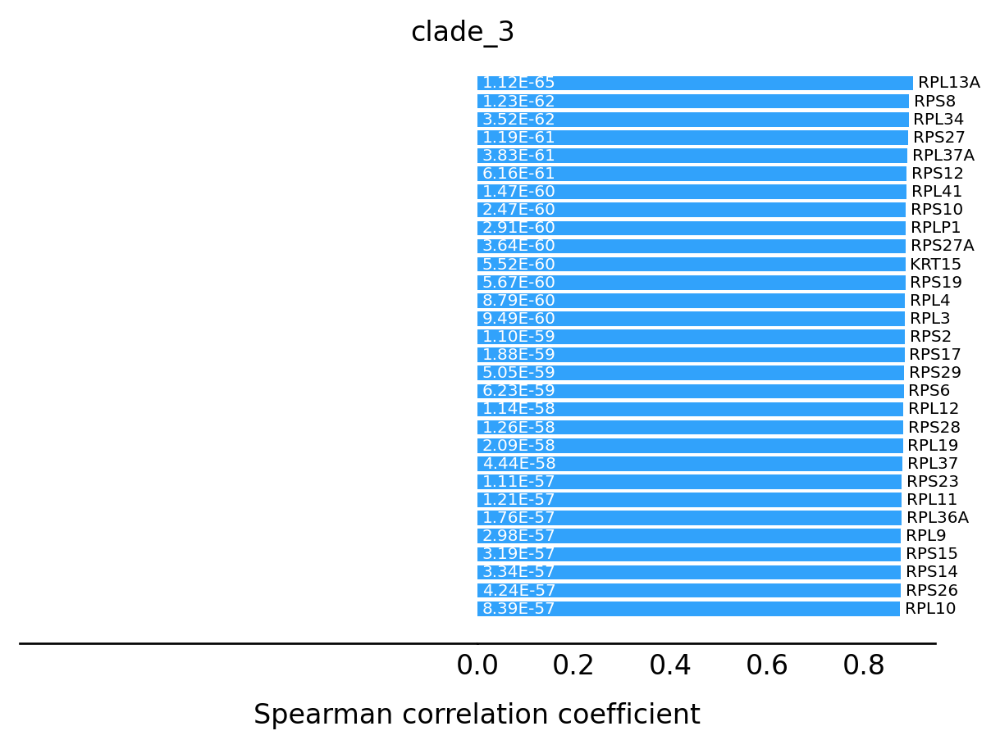

In [62]:
st.pl.trajectory.transition_markers_plot(data,top_genes=30,trajectory="clade_3",output = "before",name = "clade5_cluster2__trajectory.transition_markers_plot.pdf")


## compare two clades gene markers

In [63]:
## 1 5
st.spatial.trajectory.compare_transitions(data,trajectories=["clade_1","clade_3"])


The result of comparison between clade_1 and clade_3 stored in 'adata.uns['compare_result']'


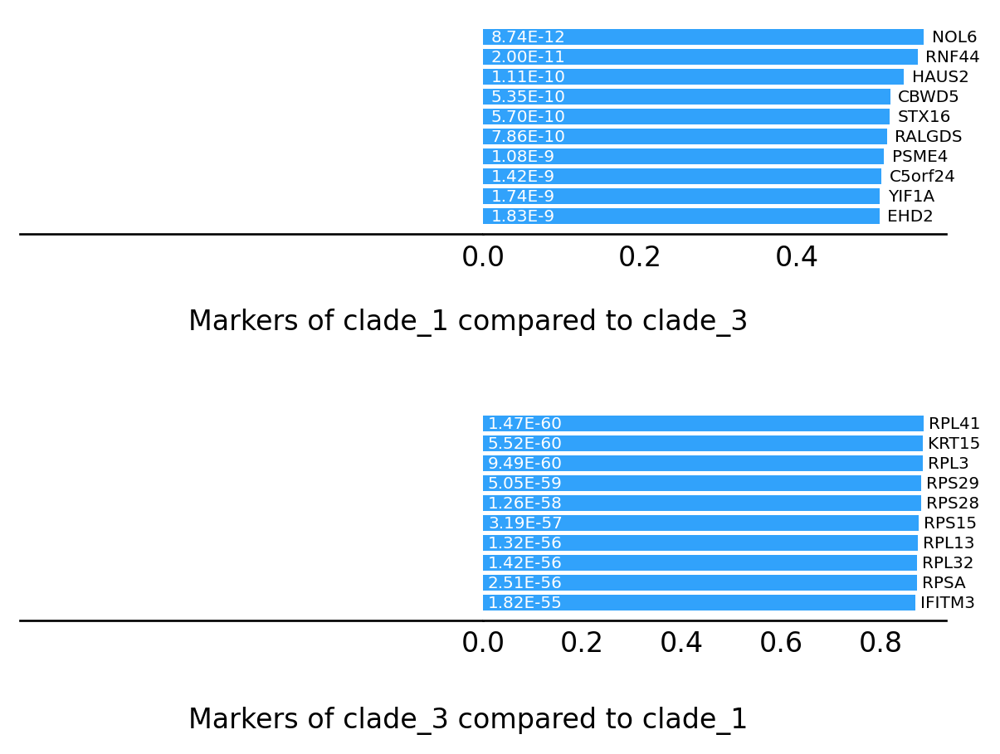

In [64]:
## 图片搞不出
#fig=plt.gcf()
st.pl.trajectory.DE_transition_plot(data,output = False)
#fig=plt.gcf()
#plt.savefig("before/clade2_19_custer2_comparison_trajectory.transition_markers_plot.pdf")


# cell cell interaction

In [14]:
lrs = st.tl.cci.load_lrs(['connectomeDB2020_lit'], species='human')
print(len(lrs))

2293


In [15]:
# Running the analysis #
st.tl.cci.run(data, lrs,
                  min_spots = 20, #Filter out any LR pairs with no scores for less than min_spots
                  distance=None, # None defaults to spot+immediate neighbours; distance=0 for within-spot mode
                  n_pairs=100, # Number of random pairs to generate; low as example, recommend ~10,000
                  n_cpus=4, # Number of CPUs for parallel. If None, detects & use all available.
                  )

lr_info = data.uns['lr_summary'] # A dataframe detailing the LR pairs ranked by number of significant spots.
print('\n', lr_info)


Calculating neighbours...
0 spots with no neighbours, 6 median spot neighbours.
Spot neighbour indices stored in adata.obsm['spot_neighbours'] & adata.obsm['spot_neigh_bcs'].
Altogether 794 valid L-R pairs


Generating backgrounds & testing each LR pair...: 100%|████ [ time left: 00:00 ]


Storing results:

lr_scores stored in adata.obsm['lr_scores'].
p_vals stored in adata.obsm['p_vals'].
p_adjs stored in adata.obsm['p_adjs'].
-log10(p_adjs) stored in adata.obsm['-log10(p_adjs)'].
lr_sig_scores stored in adata.obsm['lr_sig_scores'].

Per-spot results in adata.obsm have columns in same order as rows in adata.uns['lr_summary'].
Summary of LR results in adata.uns['lr_summary'].

                 n_spots  n_spots_sig  n_spots_sig_pval
DSC2_DSG3           226           51               138
SLPI_PLSCR1         186           43                85
THBS2_ITGA6         171           39                82
TNC_ITGB1           171           38                66
HSP90AA1_FGFR3      223           38               128
...                 ...          ...               ...
LTA_TNFRSF1A         21            0                17
CCL5_CXCR3           21            0                14
TSLP_IL7R            31            0                12
JAG1_NOTCH2         182            0                2

## pvalue adjust

In [67]:
st.tl.cci.adj_pvals(data, correct_axis='spot',
                   pval_adj_cutoff=0.05, adj_method='fdr_bh')

Updated adata.uns[lr_summary]
Updated adata.obsm[lr_scores]
Updated adata.obsm[lr_sig_scores]
Updated adata.obsm[p_vals]
Updated adata.obsm[p_adjs]
Updated adata.obsm[-log10(p_adjs)]


## visualize

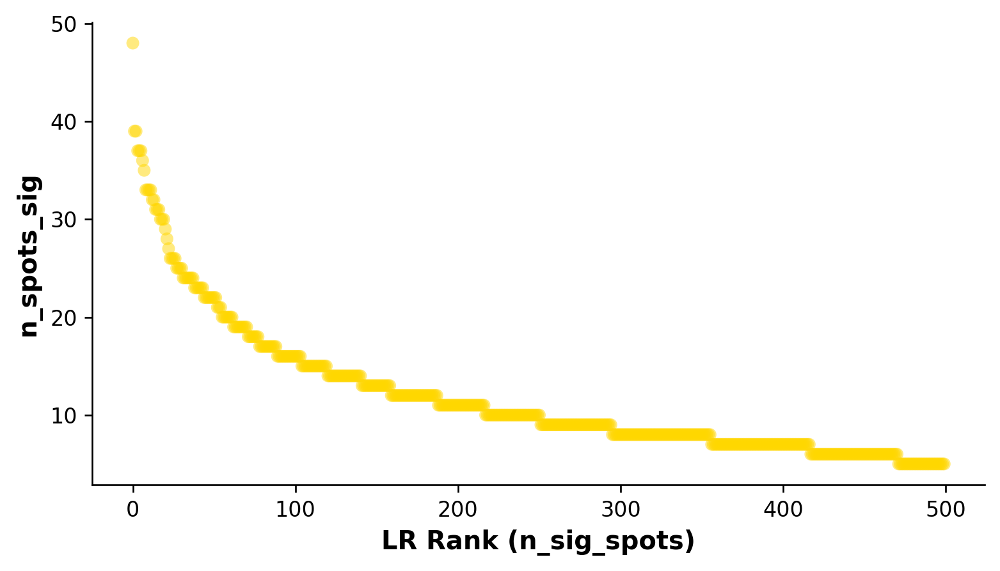

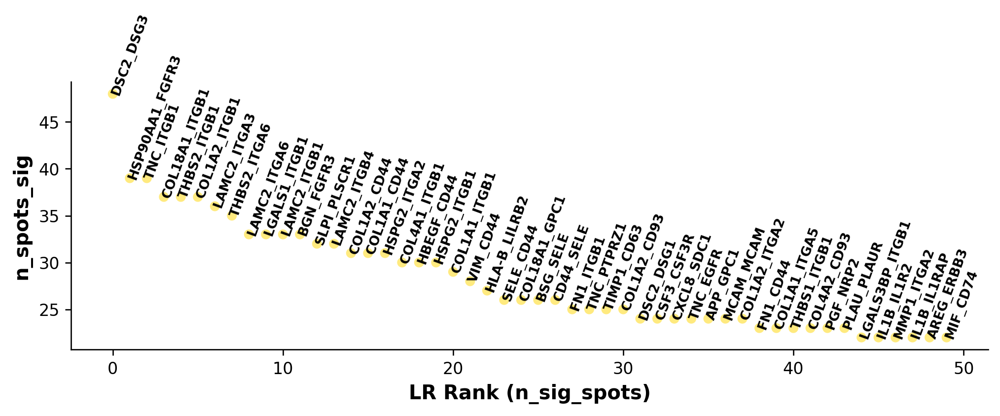

In [68]:
# Showing the rankings of the LR from a global and local perspective.
# Ranking based on number of significant hotspots.
st.pl.lr_summary(data, n_top=500,show = False)
fig=plt.gcf()
fig.savefig("before/lr_summary_stat.pdf")
st.pl.lr_summary(data, n_top=50, figsize=(10,3),show= False)
fig=plt.gcf()
fig.savefig("before/lr_summary_pairs.pdf")

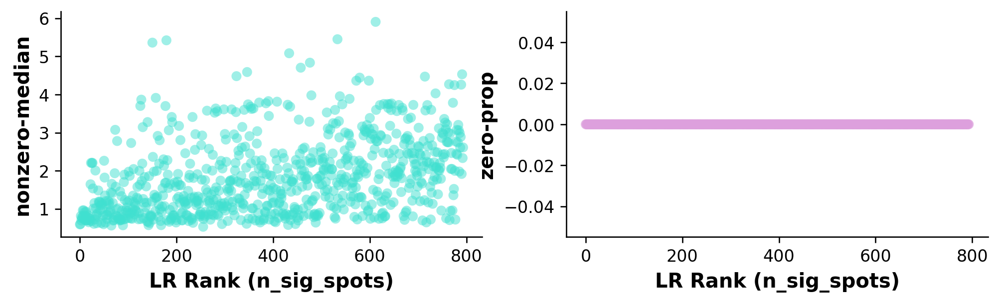

In [69]:
st.pl.lr_diagnostics(data, figsize=(10,2.5),show = False)
fig=plt.gcf()
fig.savefig("before/lr_diagnostics.pdf")

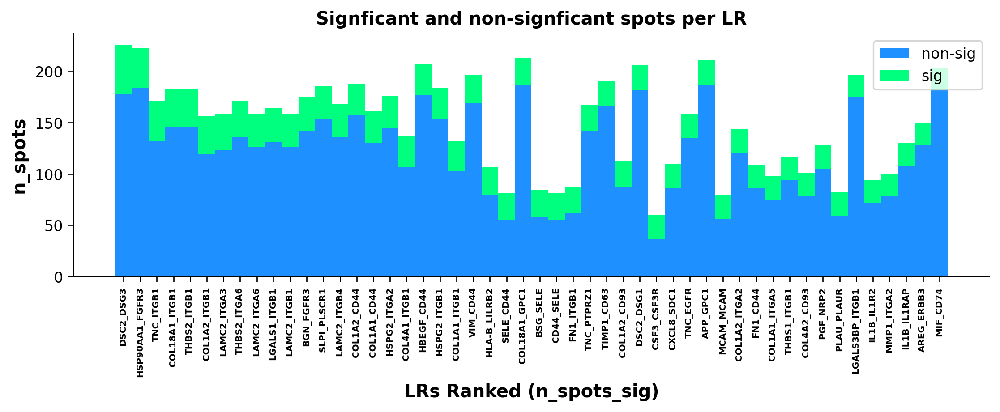

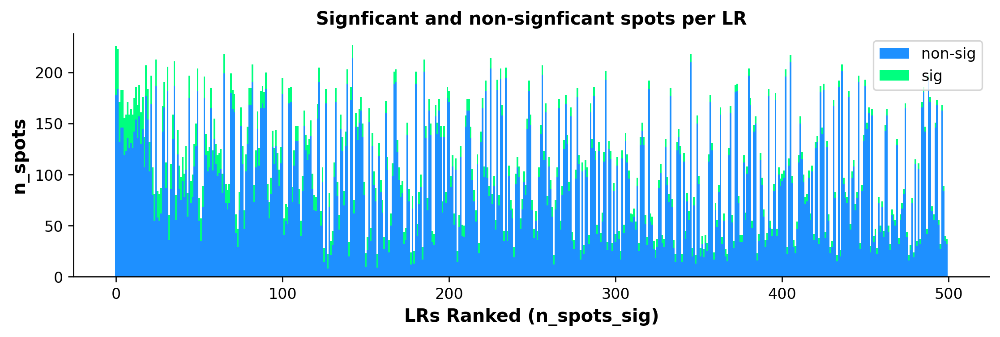

In [70]:
st.pl.lr_n_spots(data, n_top=50, figsize=(11, 3),
                    max_text=100,show = False)
fig=plt.gcf()
fig.savefig("before/lr_n_spots50.pdf")
st.pl.lr_n_spots(data, n_top=500, figsize=(11, 3),
                    max_text=100,show=False)
fig=plt.gcf()
fig.savefig("before/lr_n_spots500.pdf")

## Biologics plot 

In [16]:
## Running the GO enrichment analysis ##
r_path = "/usr/local/bin/R/Library/Frameworks/R.framework/Resources"
st.tl.cci.run_lr_go(data, r_path)

ModuleNotFoundError: No module named 'rpy2'

In [20]:
best_lr = data.uns['lr_summary'].index.values[0] # Just choosing one of the top from lr_summary
int_lr = 'COL1A1_ITGB1'

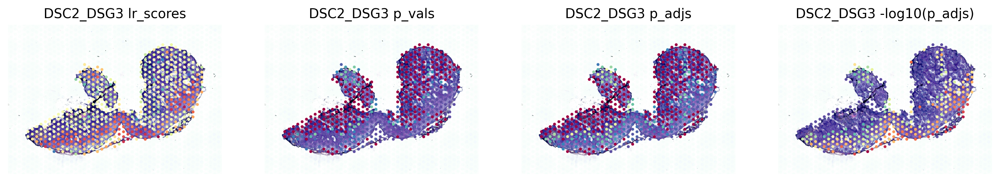

In [72]:
### best pair
stats = ['lr_scores', 'p_vals', 'p_adjs', '-log10(p_adjs)']
fig, axes = plt.subplots(ncols=len(stats), figsize=(16,6))
for i, stat in enumerate(stats):
    st.pl.lr_result_plot(data, use_result=stat, use_lr=best_lr, show_color_bar=False, ax=axes[i])
    axes[i].set_title(f'{best_lr} {stat}')
fig=plt.gcf()
fig.savefig("before/lr_result_DSC2_DSG3.pdf")

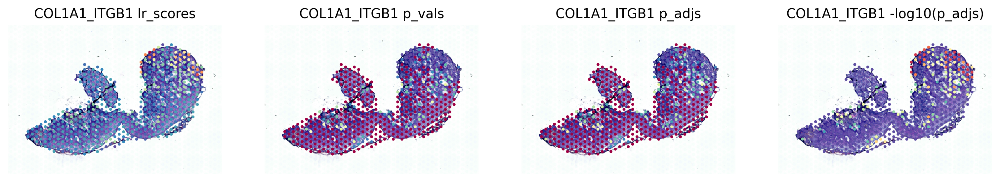

In [39]:
### COL1A1 ITGB1 pair
stats = ['lr_scores', 'p_vals', 'p_adjs', '-log10(p_adjs)']
fig, axes = plt.subplots(ncols=len(stats), figsize=(16,6))
for i, stat in enumerate(stats):
    st.pl.lr_result_plot(data, use_result=stat, use_lr=int_lr, show_color_bar=False, ax=axes[i])
    axes[i].set_title(f'{int_lr} {stat}')
fig=plt.gcf()
fig.savefig("before/lr_result_COL1A1_ITGB1.pdf")

Text(0.5, 1.0, 'DSC2_DSG3 lr_sig_scores')

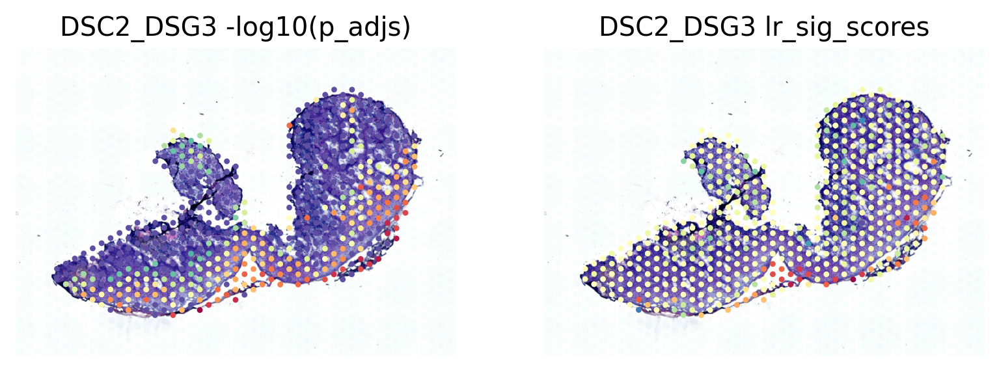

In [73]:
fig, axes = plt.subplots(ncols=2, figsize=(8,6))
st.pl.lr_result_plot(data, use_result='-log10(p_adjs)', use_lr=best_lr, show_color_bar=False, ax=axes[0])
st.pl.lr_result_plot(data, use_result='lr_sig_scores', use_lr=best_lr, show_color_bar=False, ax=axes[1])
axes[0].set_title(f'{best_lr} -log10(p_adjs)')
axes[1].set_title(f'{best_lr} lr_sig_scores')

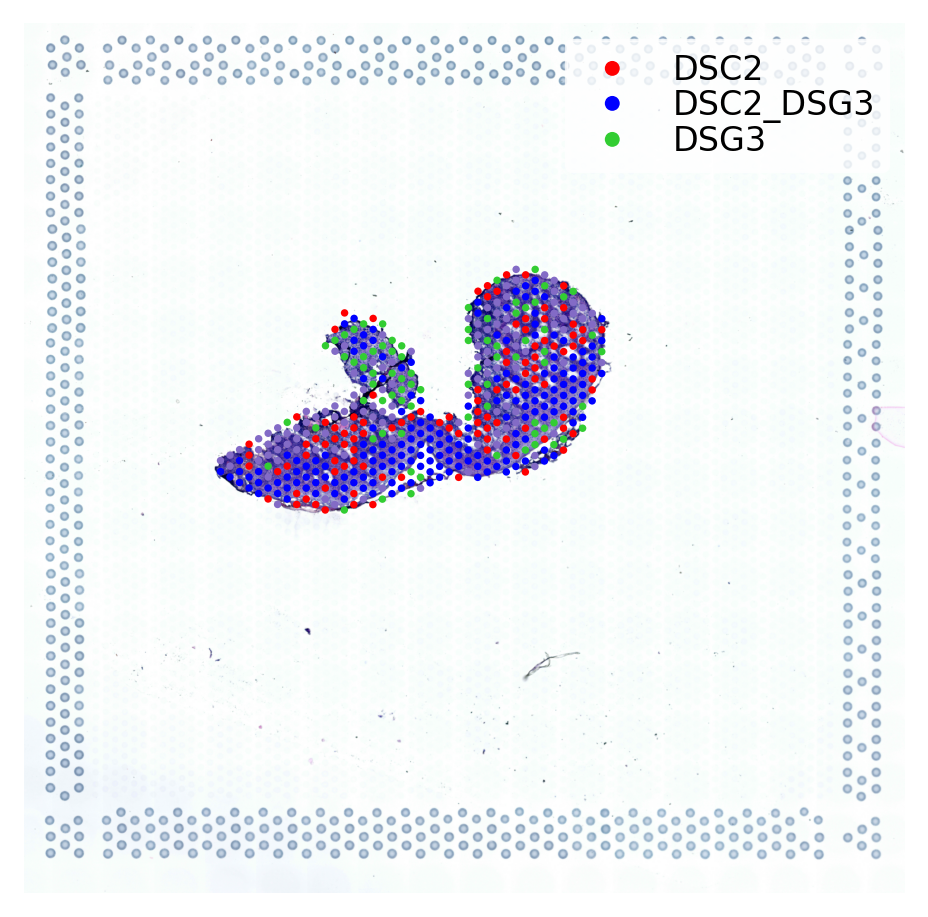

In [22]:
st.pl.lr_plot(data, best_lr, inner_size_prop=0.1, outer_mode='binary', pt_scale=5,
              use_label=None, show_image=True,
              sig_spots=False)
fig=plt.gcf()
fig.savefig("before/coexistence_lr_result_DSC2_DSG3.pdf")

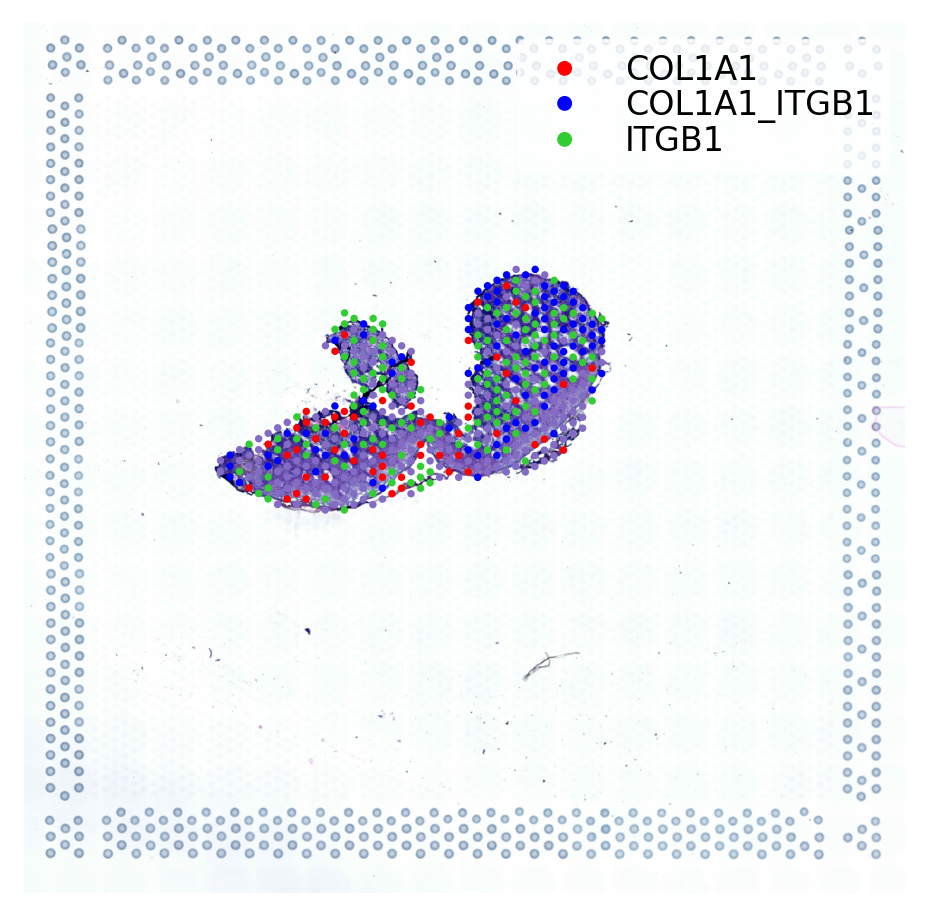

In [23]:
## int_lr
st.pl.lr_plot(data, int_lr, inner_size_prop=0.1, outer_mode='binary', pt_scale=5,
              use_label=None, show_image=True,
              sig_spots=False)
fig=plt.gcf()
fig.savefig("before/coexistence_lr_result_COL1A1_ITGB1.pdf")

## Predicting significant CCIs

In [25]:
st.tl.cci.run_cci(data, 'seurat_anno', # Spot cell information either in data.obs or data.uns
                  min_spots=3, # Minimum number of spots for LR to be tested.
                  spot_mixtures=True, # If True will use the label transfer scores,
                                      # so spots can have multiple cell types if score>cell_prop_cutoff
                  cell_prop_cutoff=0.2, # Spot considered to have cell type if score>0.2
                  sig_spots=True, # Only consider neighbourhoods of spots which had significant LR scores.
                  n_perms=800 # Permutations of cell information to get background, recommend ~1000
                 )

Falling back to discrete mode.
Significant counts of cci_rank interactions for all LR pairs in lr_cci_seurat_anno
Significant counts of cci_rank interactions for each LR pair stored in dictionary per_lr_cci_seurat_anno


## Diagnostic plot: check interaction and cell type frequency correlation

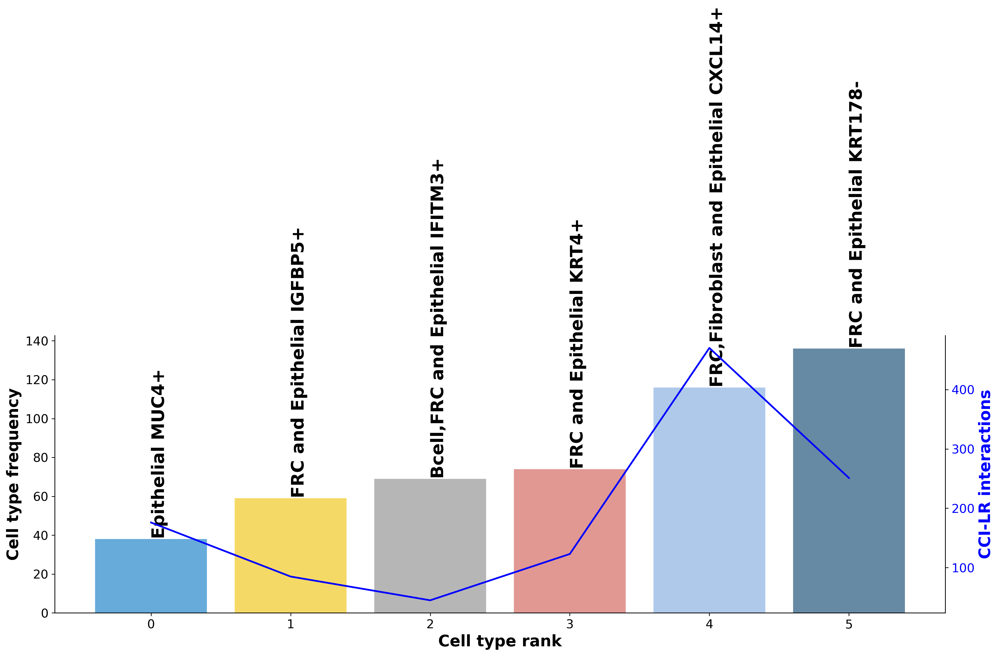

In [78]:
cci_check(data, "seurat_anno",show= False)
fig=plt.gcf()
fig.savefig("before/cci_check.pdf")

# CCI Visualisations

## CCI network

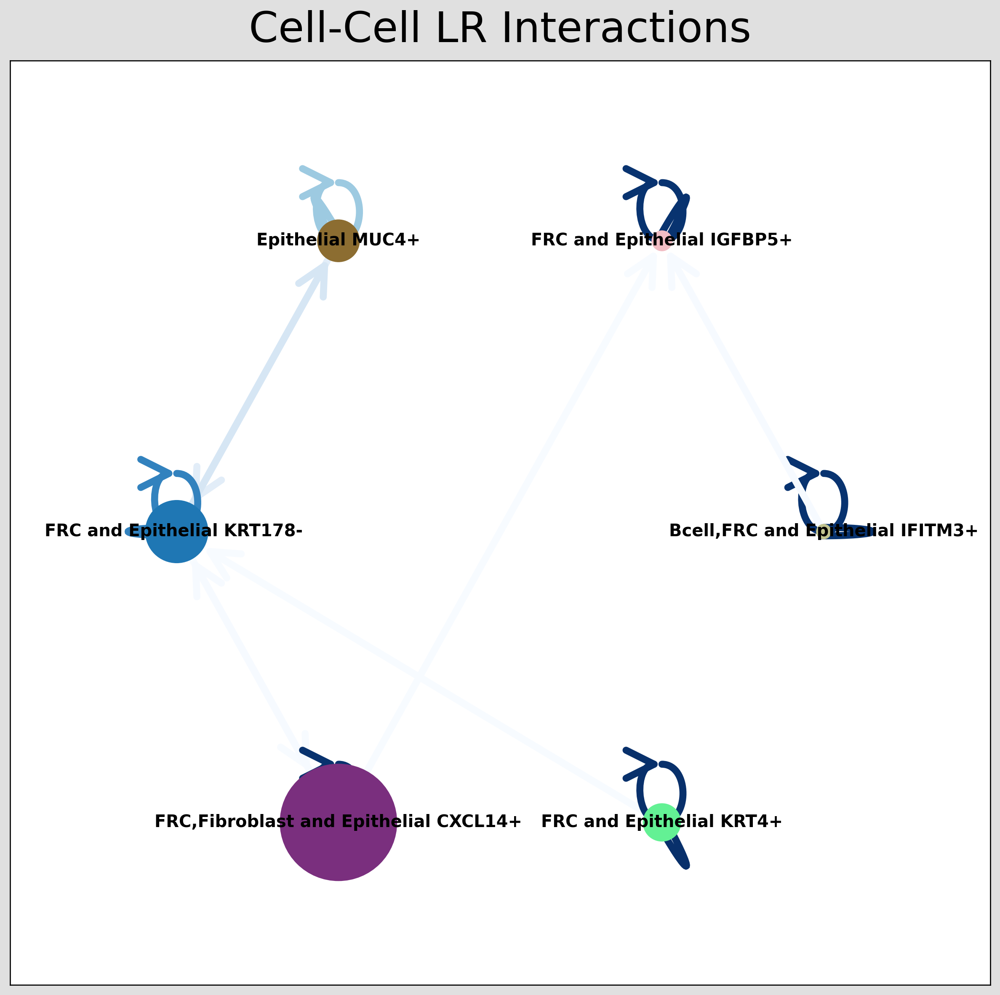

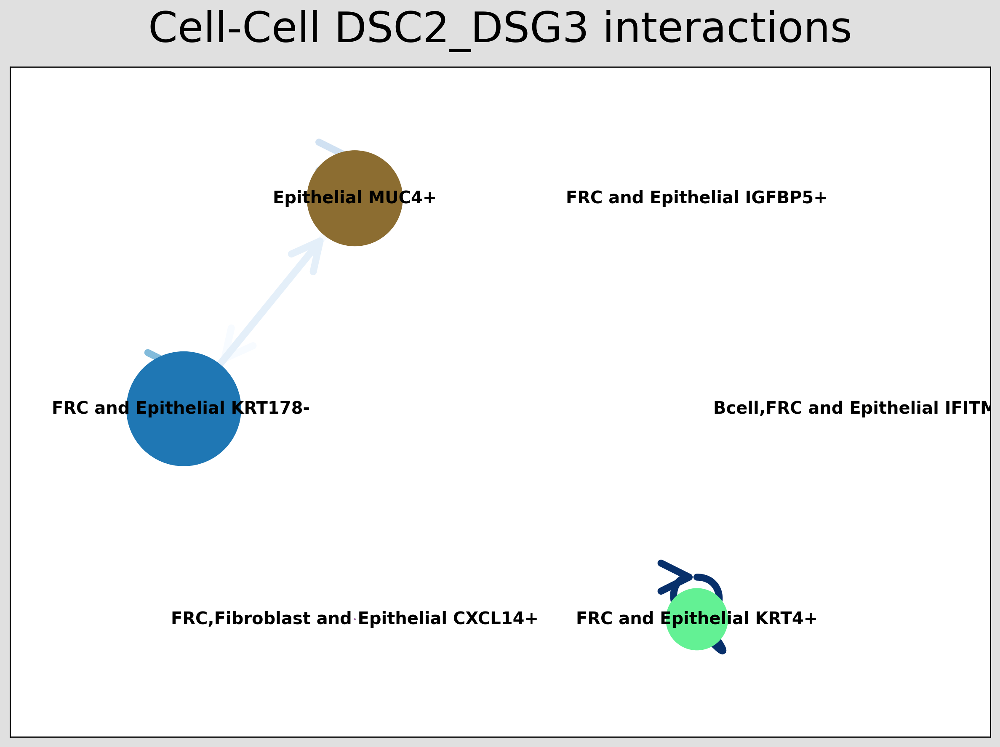

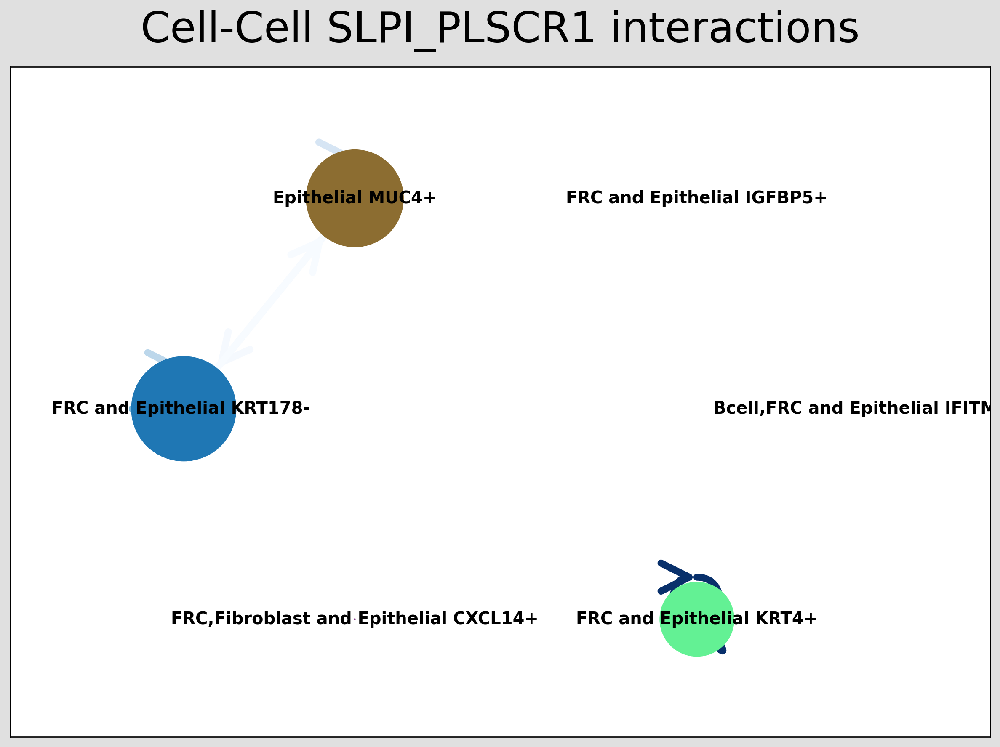

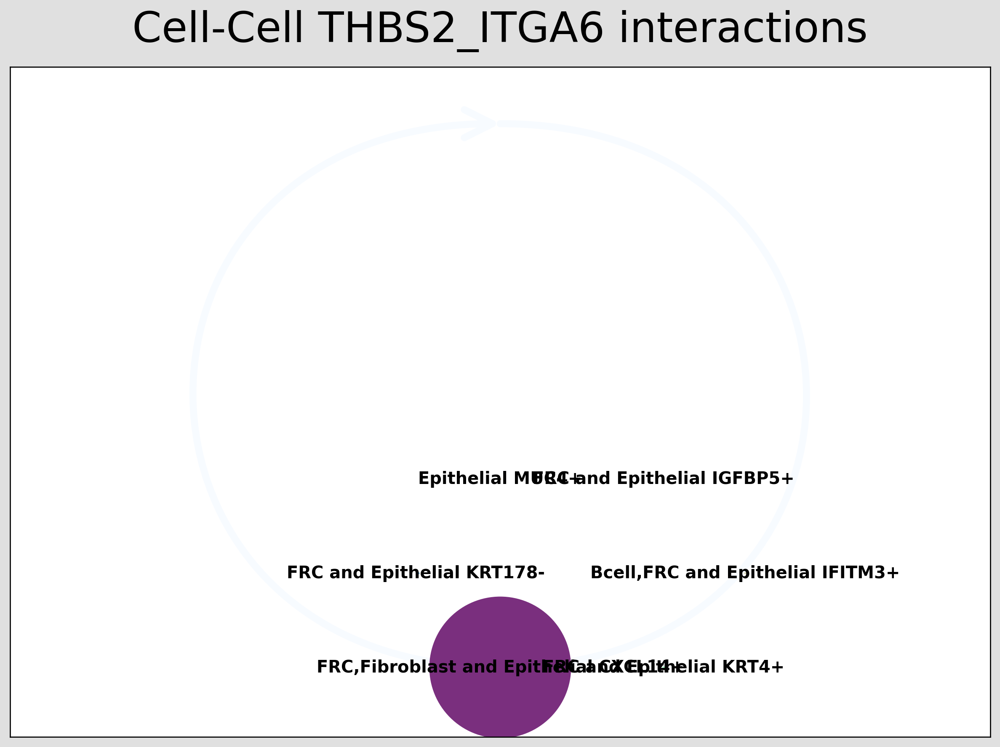

In [31]:
# Visualising the no. of interactions between cell types across all LR pairs #
pos_1 = st.pl.ccinet_plot(data, 'seurat_anno', return_pos=True)
fig=plt.gcf()
fig.savefig("before/all_ccinet_plot.pdf")

# Just examining the cell type interactions between selected pairs #
lrs = data.uns['lr_summary'].index.values[0:3]
for best_lr in lrs[0:3]:
    st.pl.ccinet_plot(data, 'seurat_anno', best_lr, min_counts=2,
                         figsize=(10,7.5), pos=pos_1,
                      )
    fig=plt.gcf()
    fig.savefig("before/" + best_lr + "ccinet_plot.pdf")

In [35]:
int_lr

'THBS2_ITGA6'

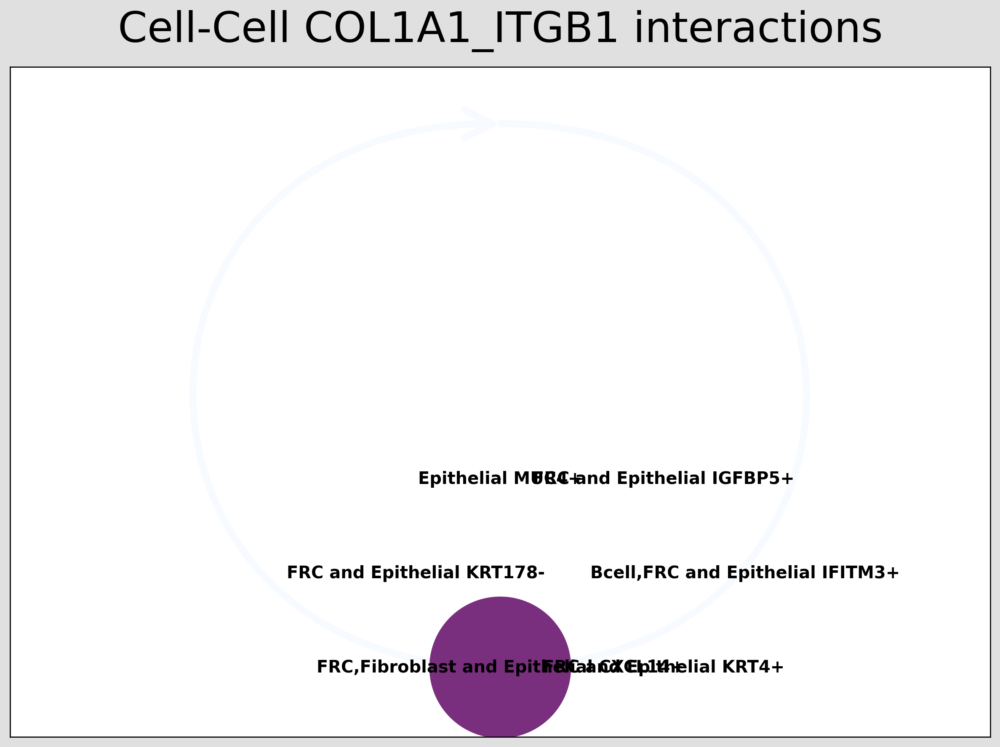

In [37]:
### int_lr
# Just examining the cell type interactions between selected pairs #
int_lr = 'COL1A1_ITGB1'
st.pl.ccinet_plot(data, 'seurat_anno', int_lr, min_counts=2,
                     figsize=(10,7.5), pos=pos_1,
                  )
fig=plt.gcf()
fig.savefig("before/" + int_lr + "ccinet_plot.pdf")

## CCI chord-plot

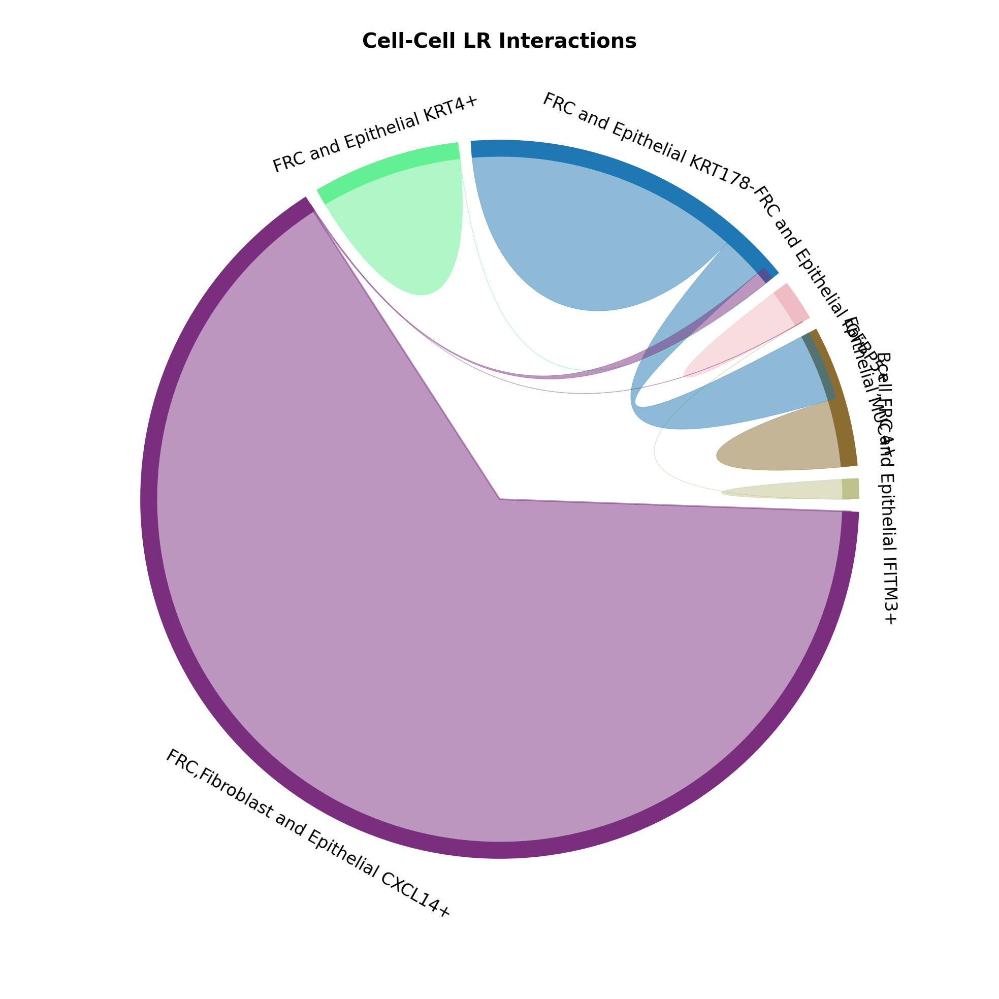

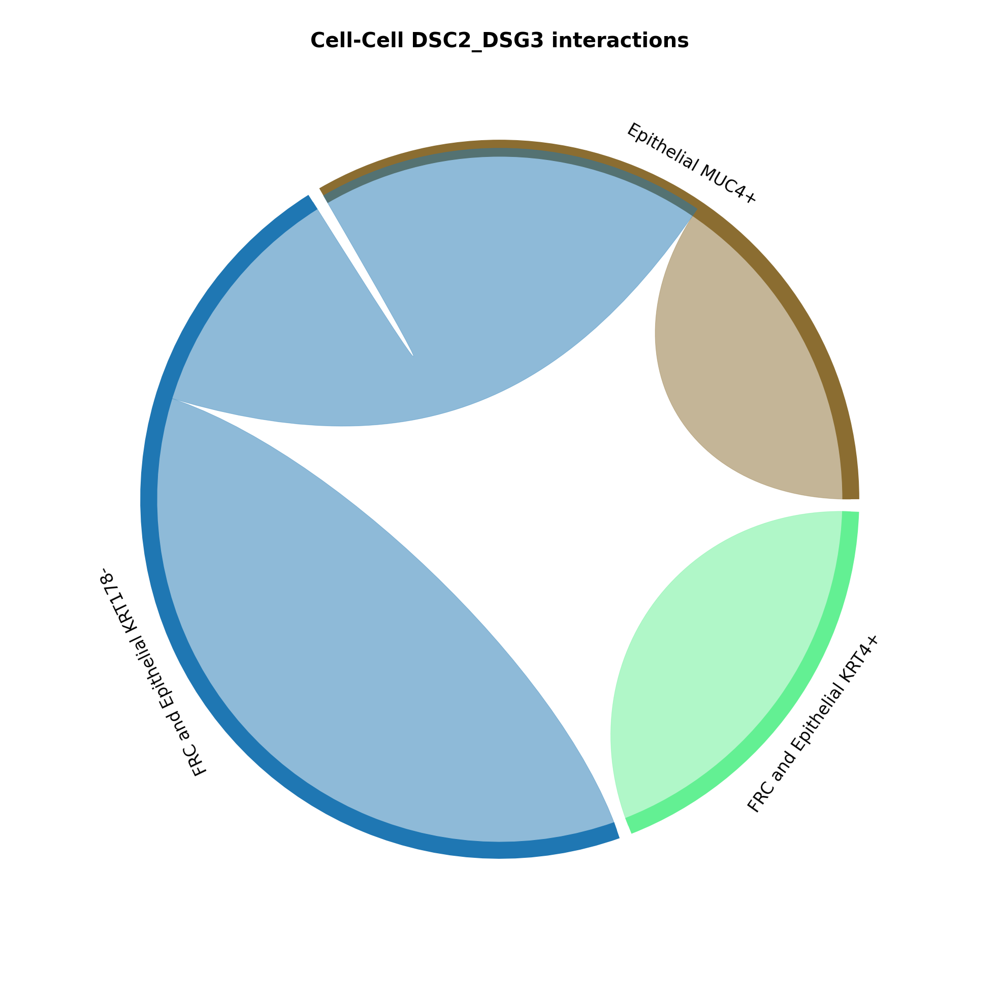

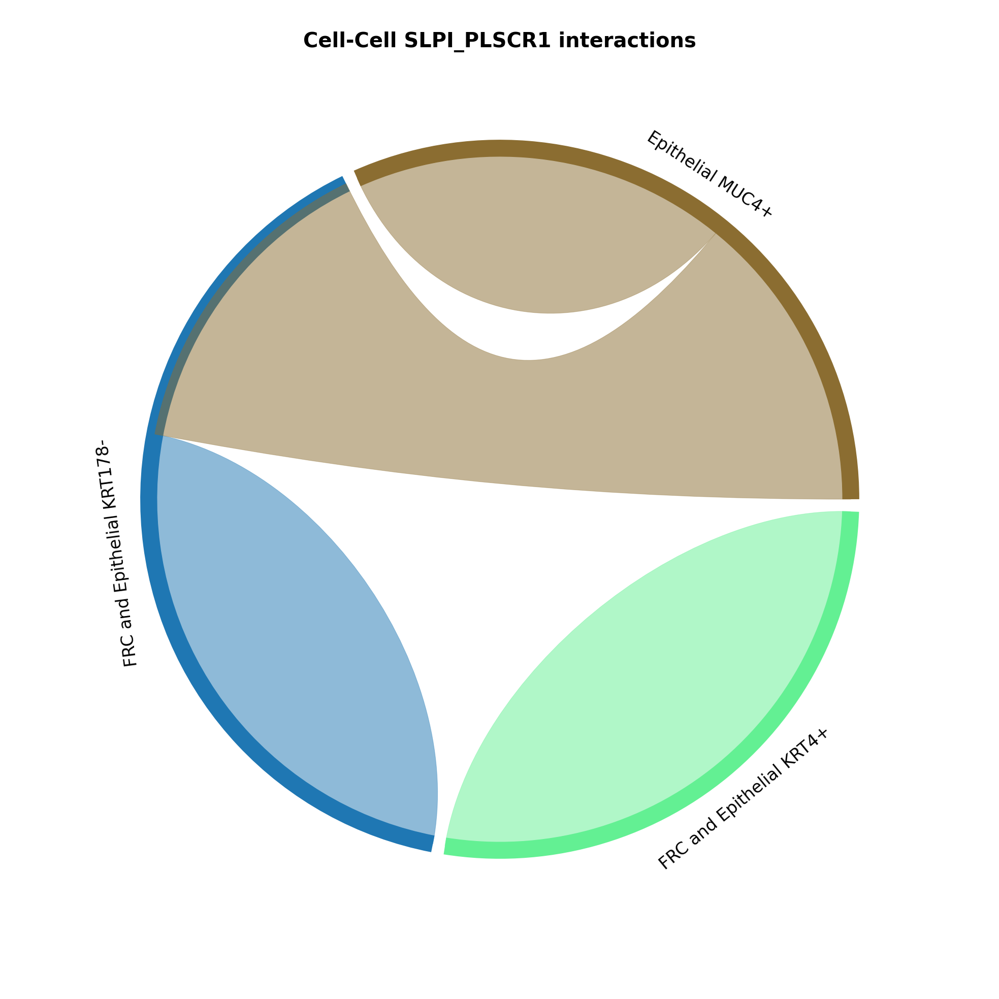

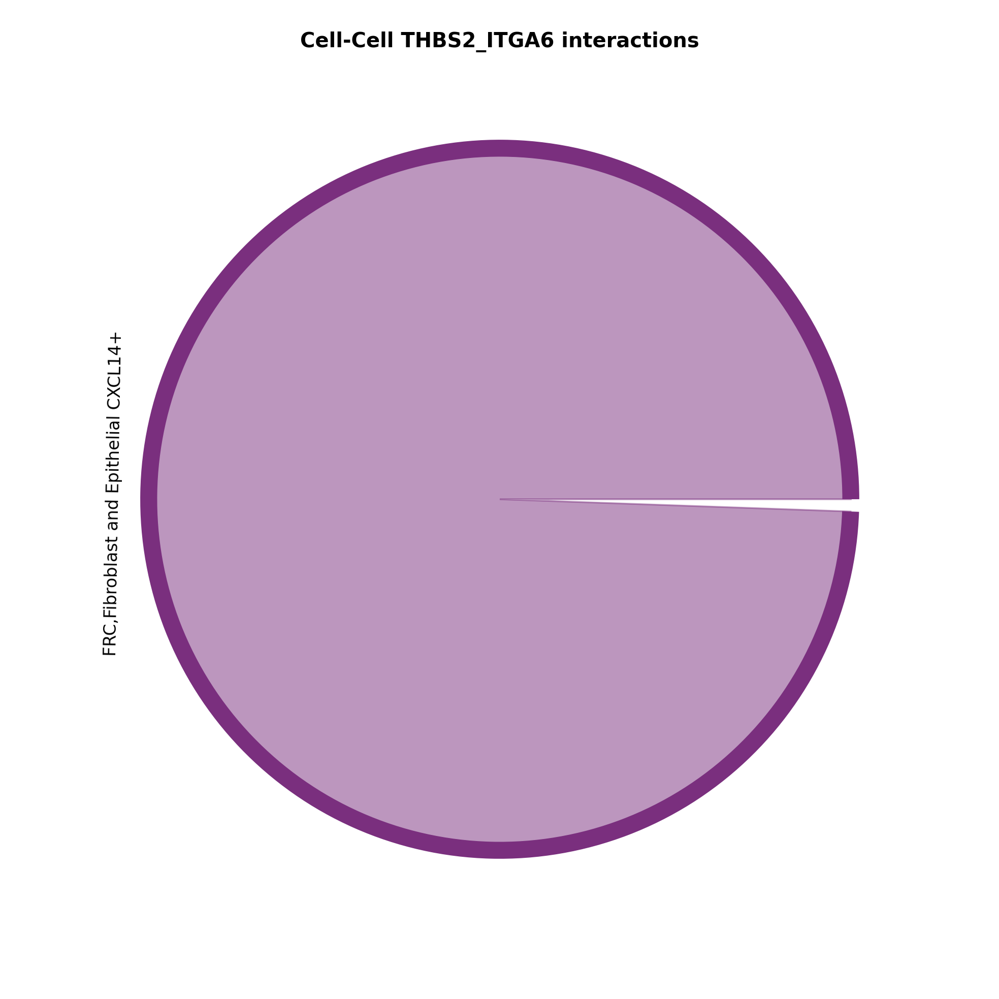

In [33]:
st.pl.lr_chord_plot(data, 'seurat_anno',show = False)
fig=plt.gcf()
fig.savefig("before/All_lr_chord_plot.pdf")
for lr in lrs:
    st.pl.lr_chord_plot(data, 'seurat_anno', lr,show = False)
    fig=plt.gcf()
    fig.savefig("before/" +lr + "lr_chord_plot.pdf")

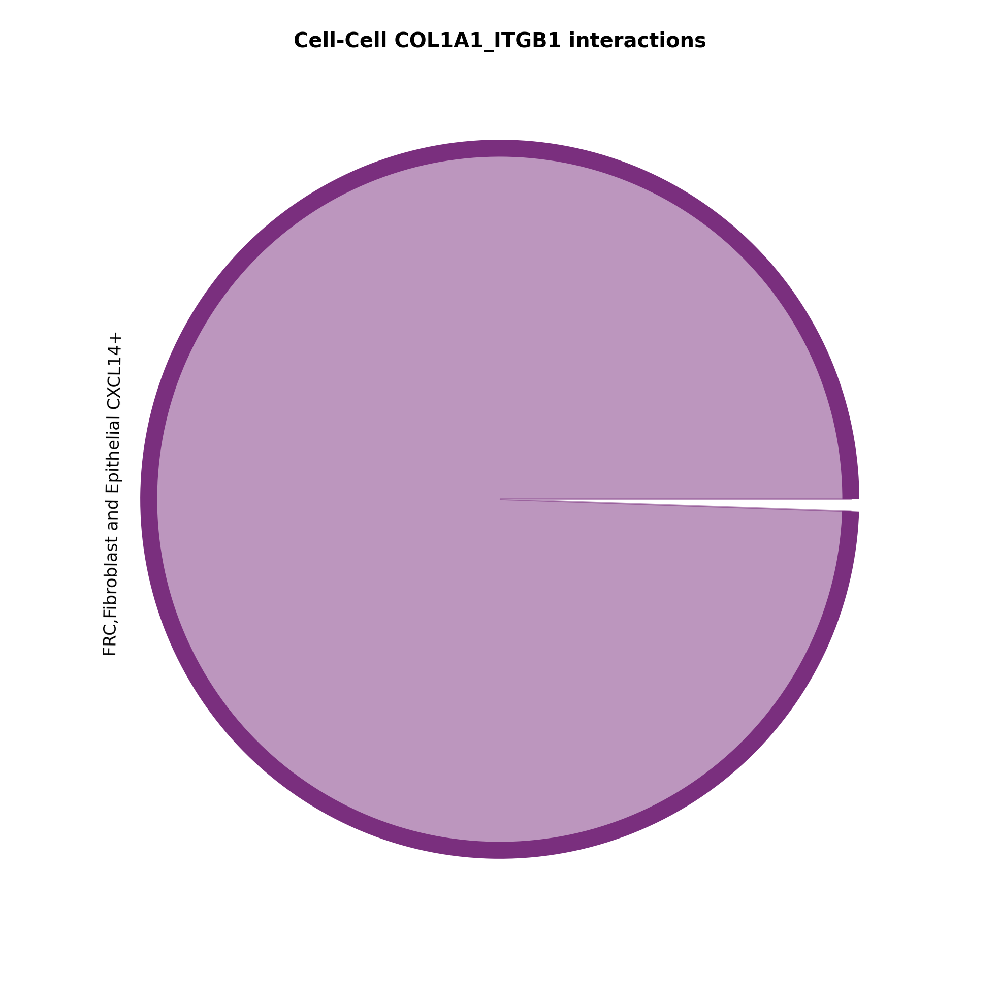

In [38]:
## int_lr
st.pl.lr_chord_plot(data, 'seurat_anno', int_lr,show = False)
fig=plt.gcf()
fig.savefig("before/" + int_lr + "lr_chord_plot.pdf")

## Heatmap Visualisations

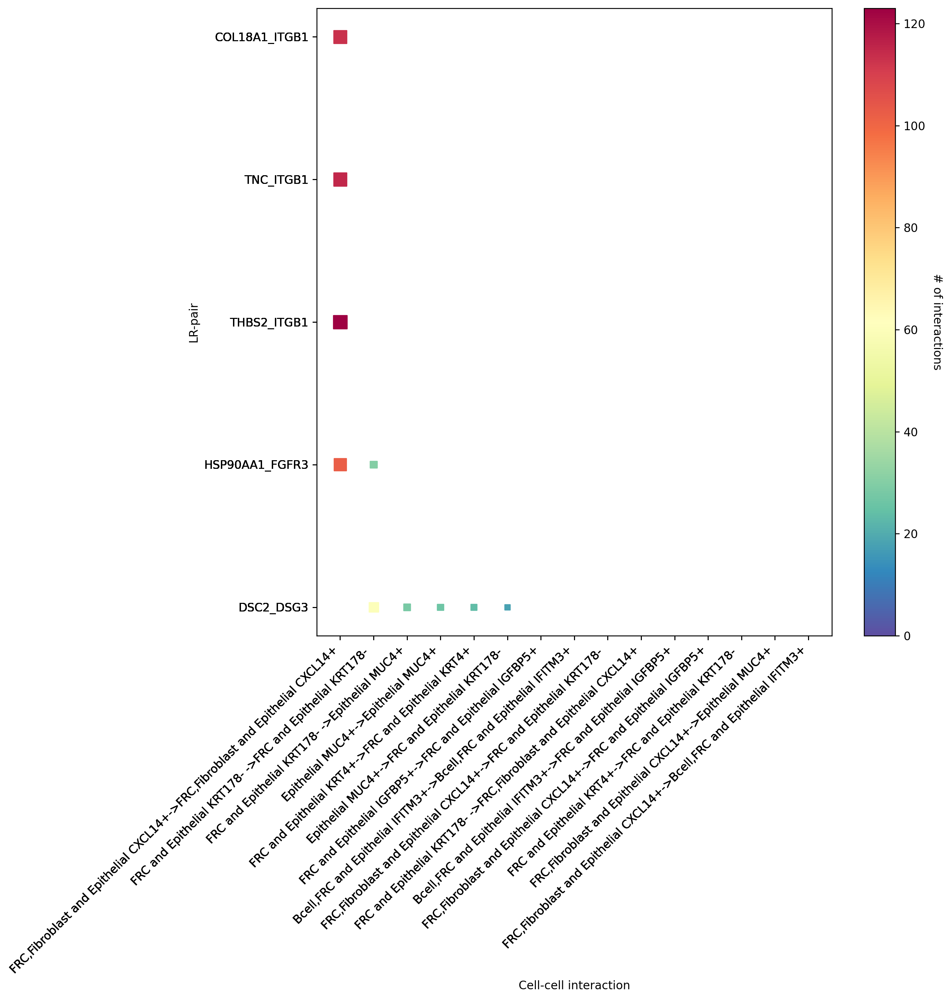

In [81]:
st.pl.lr_cci_map(data, 'seurat_anno', lrs=None, min_total=100, figsize=(10,10))
fig=plt.gcf()
fig.savefig("before/lr_cci_map.pdf")

## CCI Maps

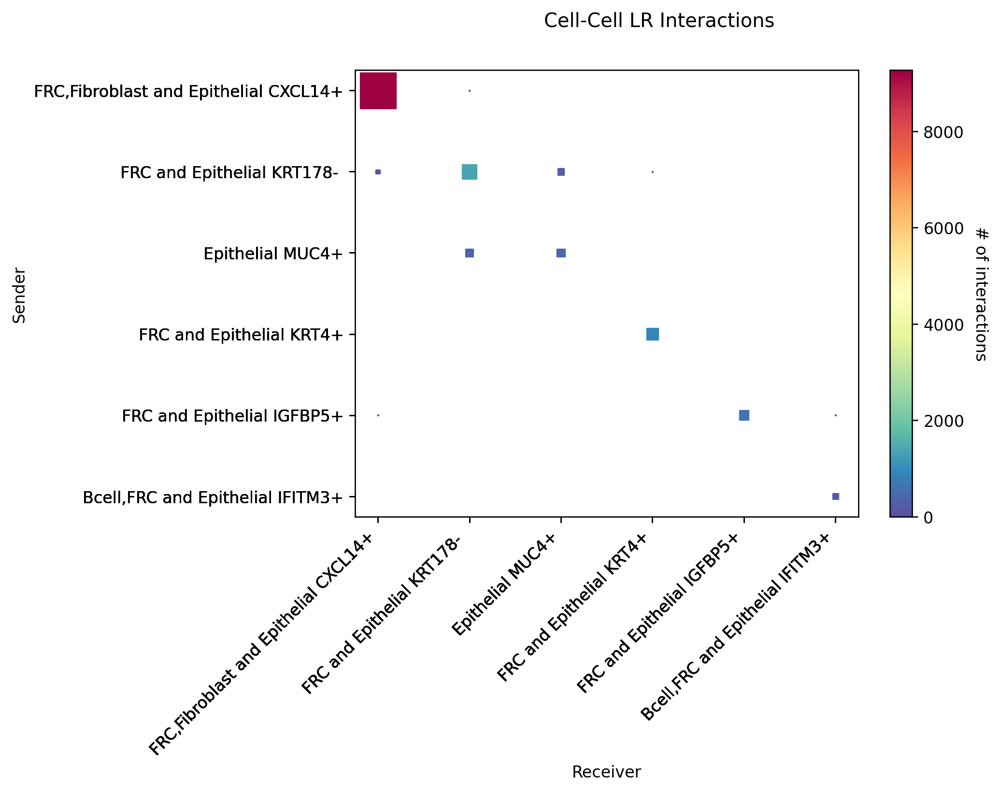

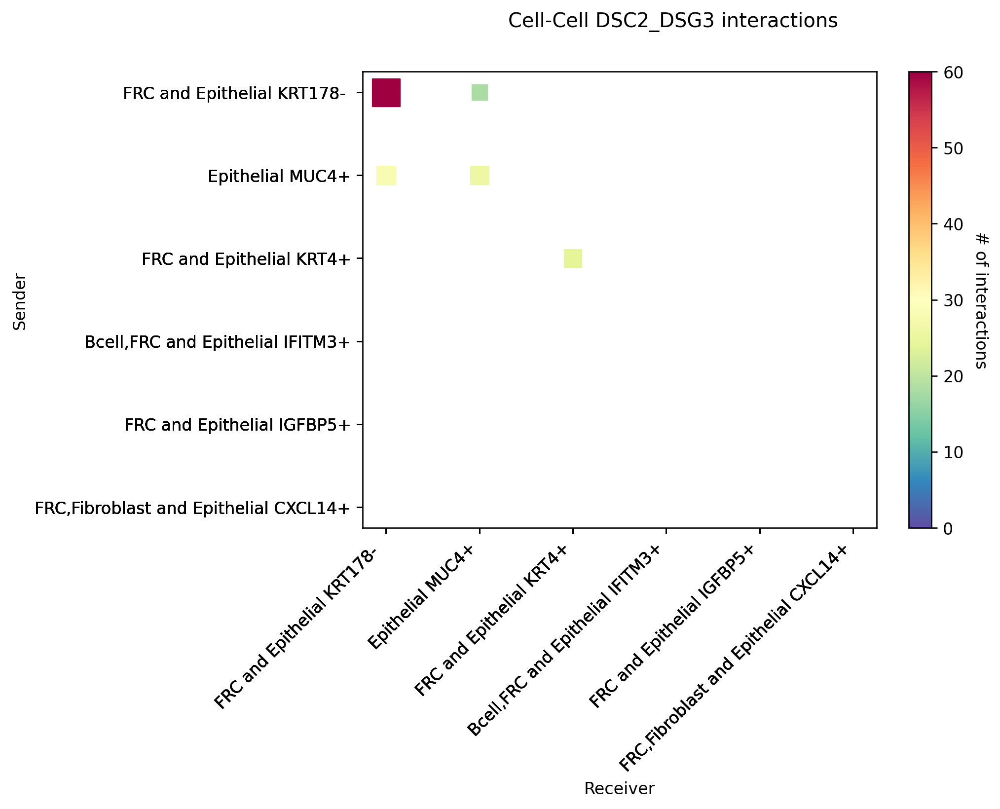

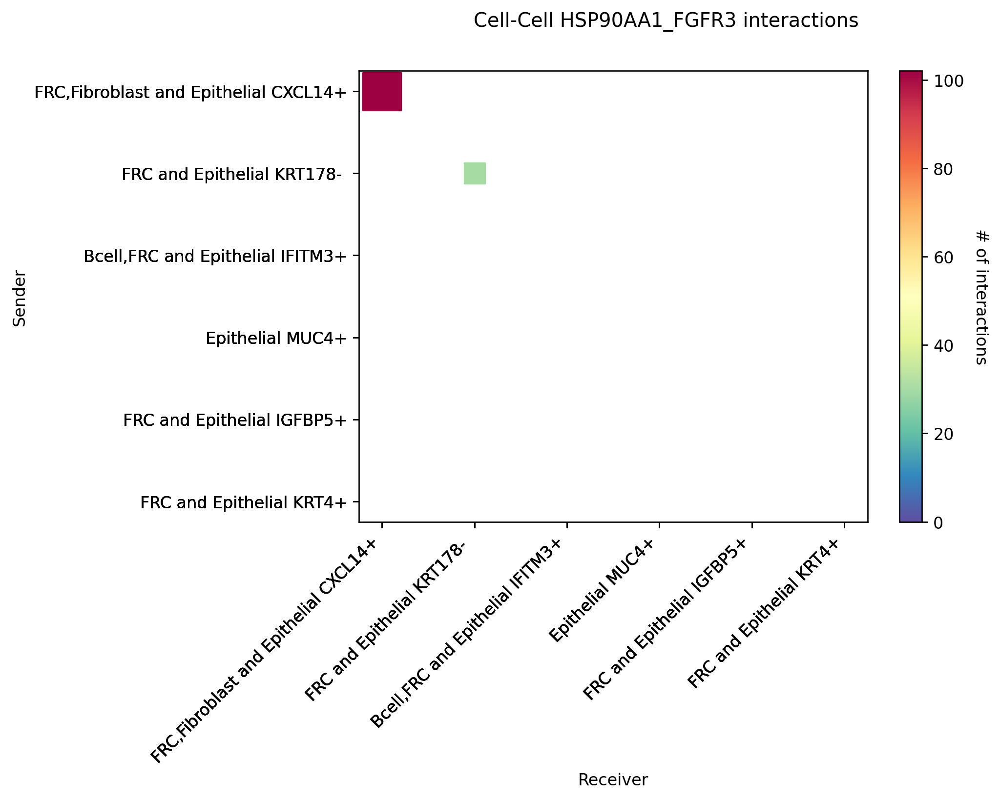

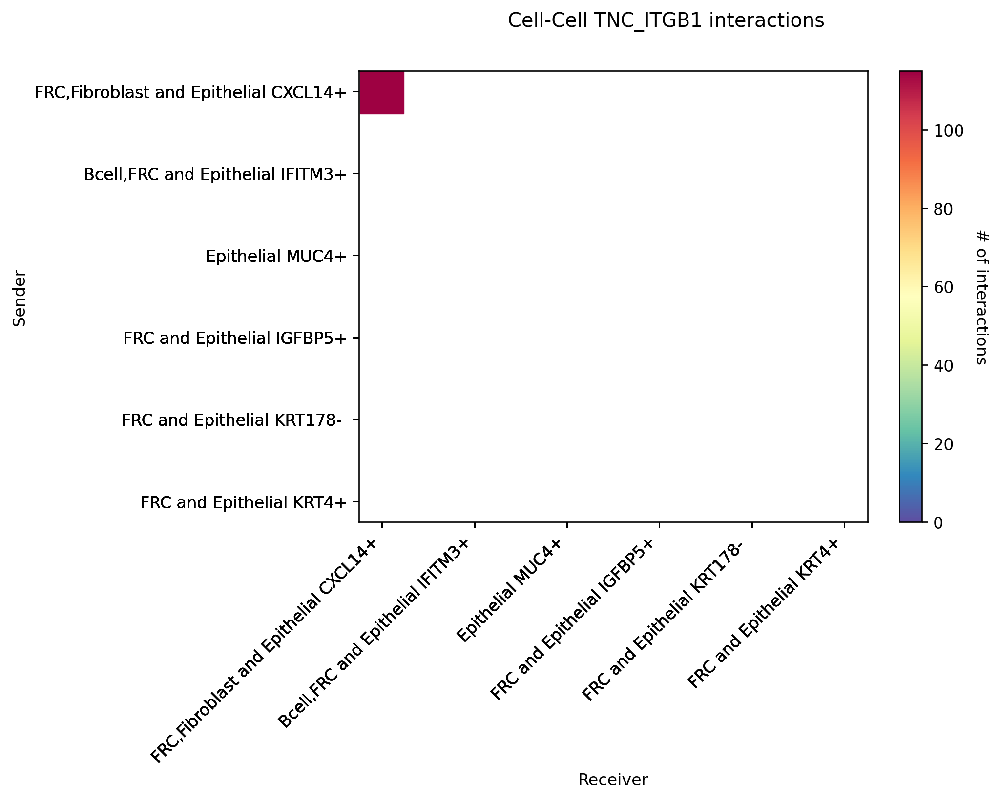

In [82]:
st.pl.cci_map(data, 'seurat_anno')

lrs = data.uns['lr_summary'].index.values[0:3]
for lr in lrs[0:3]:
    st.pl.cci_map(data, 'seurat_anno', lr)
    fig=plt.gcf()
    fig.savefig("before/" + lr + "cci_maps.pdf")

## Function prep

In [10]:

def cci_check(
    adata: AnnData,
    use_label: str,
    figsize=(16, 10),
    cell_label_size=20,
    axis_text_size=18,
    tick_size=14,
    show=True,
):
    """Checks relationship between no. of significant CCI-LR interactions and cell type frequency.

    Parameters
    ----------
    adata: AnnData
        Data on which st.tl.cci.run & st.tl.cci.run_cci has been performed.
    use_label: str
        The cell type label information used when running st.tl.cci.run_cci
    figsize: tuple
        Size of outputted figure.
    cell_label_size: int
        Size of the cell labels put on top of the bar chart.
    axis_text_size: int
        Size of the axis text.
    tick_size: int
        Size of the ticks displayed at bottom of chart.
    show: bool
        Whether to show the plot or not; if false returns figure & axes.
    Returns
    -------
    Figure, Ax1, Ax2
        The figure, axes for the barchart, and twin axes for the lineplot.
    """
    labels = adata.obs[use_label].values.astype(str)
    label_set = np.array(list(adata.obs[use_label].cat.categories))
    #colors = get_colors(adata, use_label)
    xs = np.array(list(range(len(label_set))))
    int_dfs = adata.uns[f"per_lr_cci_{use_label}"]

    # Counting!!! #
    cell_counts = []  # Cell type frequencies
    cell_sigs = []  # Cell type significant interactions
    for j, label in enumerate(label_set):
        counts = sum(labels == label)
        cell_counts.append(counts)

        int_count = 0
        for lr in int_dfs:
            int_df = int_dfs[lr]
            label_index = np.where(int_df.index.values == label)[0][0]
            int_bool = int_df.values > 0
            int_count += sum(int_bool[label_index, :])
            int_count += sum(int_bool[:, label_index])
            # prevent double counts
            int_count -= int_bool[label_index, label_index]

        cell_sigs.append(int_count)

    cell_counts = np.array(cell_counts)
    cell_sigs = np.array(cell_sigs)
    order = np.argsort(cell_counts)
    cell_counts = cell_counts[order]
    cell_sigs = cell_sigs[order]
    colors = colors_
    label_set = label_set[order]

    # Plotting bar plot #
    fig, ax = plt.subplots(figsize=figsize)
    ax.bar(xs, cell_counts, color=colors)
    text_dist = max(cell_counts) * 0.015
    fontdict = {"fontweight": "bold", "fontsize": cell_label_size}
    for j in range(len(xs)):
        ax.text(
            xs[j],
            cell_counts[j] + text_dist,
            label_set[j],
            rotation=90,
            fontdict=fontdict,
        )
    axis_text_fp = {"fontweight": "bold", "fontsize": axis_text_size}
    ax.set_ylabel("Cell type frequency", color="black", **axis_text_fp)
    ax.spines["top"].set_visible(False)
    ax.tick_params(labelsize=tick_size)
    ax.set_xlabel("Cell type rank", **axis_text_fp)

    # Line-plot of the interaction counts #
    ax2 = ax.twinx()
    ax2.set_ylabel("CCI-LR interactions", color="blue", **axis_text_fp)
    ax2.plot(xs, cell_sigs, color="blue", linewidth=2)
    ax2.tick_params(axis="y", labelcolor="blue", labelsize=tick_size)
    ax2.spines["top"].set_visible(False)
    ax2.tick_params(labelsize=tick_size)
    fig.tight_layout()

    if show:
        plt.show()
    else:
        return fig, ax, ax2




NameError: name 'AnnData' is not defined

In [11]:
### test function
from matplotlib import pyplot as plt
from PIL import Image
import pandas as pd
import matplotlib
import numpy as np

from stlearn._compat import Literal
from typing import Optional, Union
from anndata import AnnData
import warnings

# from .utils import get_img_from_fig, checkType
import scanpy


def non_spatial_plot(
    adata: AnnData,
    use_label: str = "louvain"
) -> Optional[AnnData]:

    """\
    A wrap function to plot all the non-spatial plot from scanpy.

    This function will produce 3 plots: PAGA graph, clustering plot in PAGA space and
    DPT in PAGA space.

    Parameters
    ----------
    adata
        Annotated data matrix.
    use_label
        Use label result of clustering method.
    dpi
        Set dpi as the resolution for the plot.
    Returns
    -------
    Nothing
    """

    # plt.rcParams['figure.dpi'] = dpi

    if "paga" in adata.uns.keys():
        # adata.uns[use_label+"_colors"] = adata.uns["tmp_color"]

        print("PAGA plot:")

        scanpy.pl.paga(adata, color=use_label,save="paga.pdf")

        scanpy.tl.draw_graph(adata, init_pos="paga")
        
        # adata.uns[use_label+"_colors"] = adata.uns["tmp_color"]

        print("Gene expression (reduced dimension) plot:")
        scanpy.pl.draw_graph(adata, color=use_label, legend_loc="on data")
        
        
        print("Diffusion pseudotime plot:")
        scanpy.pl.draw_graph(adata, color="dpt_pseudotime")
        
        
    else:

        scanpy.pl.draw_graph(adata)
        # adata.uns[use_label+"_colors"] = adata.uns["tmp_color"]

        scanpy.pl.draw_graph(adata, color=use_label, legend_loc="on data")